In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import os
import torch.nn as nn
import cv2 as cv2
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import torchvision.utils as vutils
from torch.nn import Module, Sequential, Conv2d, ConvTranspose2d, LeakyReLU, BatchNorm2d, ReLU, Tanh, Sigmoid, BCELoss 

%matplotlib inline
# path to the image directory
dir_data  = "Real"
 
# setting image shape to 32x32
img_shape = (128, 128, 3)
 
# listing out all file names
nm_imgs   = np.sort(os.listdir(dir_data))


In [2]:
X_train = []
for file in nm_imgs:
    img = Image.open(dir_data+'/'+file)
    img = img.convert('RGB')
    img = img.resize((128,128))
    img = np.asarray(img)/255
    X_train.append(img)
 
X_train = np.array(X_train)
X_train.shape

(3961, 128, 128, 3)

In [3]:
from numpy import asarray
from numpy import savez_compressed
 
# save to npy file
savez_compressed('kaggle_images_32x32.npz', X_train)

In [4]:
# load dict of arrays
dict_data = np.load('kaggle_images_32x32.npz')
 
# extract the first array
data = dict_data['arr_0']
 
# print the array
print(data)

[[[[0.         0.         0.        ]
   [0.         0.         0.        ]
   [0.         0.         0.        ]
   ...
   [0.         0.         0.        ]
   [0.         0.         0.        ]
   [0.         0.         0.        ]]

  [[0.         0.         0.        ]
   [0.         0.         0.        ]
   [0.         0.         0.        ]
   ...
   [0.         0.         0.        ]
   [0.         0.         0.        ]
   [0.         0.         0.        ]]

  [[0.         0.         0.        ]
   [0.         0.         0.        ]
   [0.         0.         0.        ]
   ...
   [0.         0.         0.        ]
   [0.         0.         0.        ]
   [0.         0.         0.        ]]

  ...

  [[0.15686275 0.15686275 0.15686275]
   [0.0627451  0.0627451  0.0627451 ]
   [0.03529412 0.03529412 0.03529412]
   ...
   [0.         0.         0.        ]
   [0.         0.         0.        ]
   [0.         0.         0.        ]]

  [[0.15686275 0.15686275 0.15686275]
   [0.0

In [5]:
# plot images in a nxn grid


def plot_images(imgs,n):
    """
    imgs: vector containing all the numpy images
    grid_size: 2x2 or 5x5 grid containing images
    """    
    
    fig = plt.figure(figsize = (5, 5))
    #columns = rows = grid_size
    #plt.title("Training Images")
    
    
    plt.axis("off")
    #fig.add_subplot(rows, columns, i)
    plt.imshow(imgs[0])
    plt.savefig('Generated2/Image_{:04d}.png'.format(n),transparent=True,bbox_inches='tight',pad_inches=0.05)
    plt.show()
    plt.close()

In [6]:
# load the numpy vector containing image representations
imgs = np.load('kaggle_images_32x32.npz')

# to check all the files contained in it
imgs.files

# this is where all our images are saved
imgs['arr_0'].shape


(3961, 128, 128, 3)

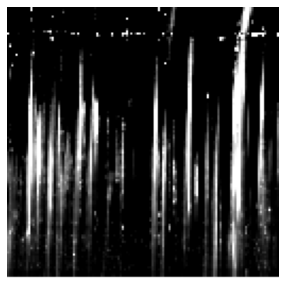

In [7]:
# 128X128 training images
plot_images(imgs['arr_0'], 3)

In [8]:
# Always good to check if gpu support available or not

dev = 'cuda:0' if torch.cuda.is_available() == True else 'cpu'
device = torch.device(dev)


In [9]:
# To check the device name
print ('Current cuda device name ', torch.cuda.get_device_name())

Current cuda device name  GeForce RTX 2080 Ti


In [10]:

class SRBDataset(Dataset):
    """SRB dataset."""

    def __init__(self, npz_imgs):
        """
        Args:
            npz_imgs (string): npz file with all the images (created in gan.ipynb)
        """
        self.imgs = npz_imgs

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        image = self.imgs[idx]

        return image

In [11]:
imgs['arr_0'][0].dtype # it will output float 128 i.e. double

# must convert it to FLOAT 128 (which is same as model weights)
np.longdouble(imgs['arr_0']).dtype

dtype('float128')

In [12]:
# Preparing dataloader for training

transpose_imgs = np.transpose( # imp step to convert image size from (7312, 32,32,3) to (7312, 3,32,32)
    np.float32(imgs['arr_0']), # imp step to convert double -> float (by default numpy input uses double as data type)
    (0, 3,1,2) # tuple to describe how to rearrange the dimensions
    ) 

dset = SRBDataset(transpose_imgs) # passing the npz variable to the constructor class
batch_size = 32
shuffle = True

dataloader = DataLoader(dataset = dset, batch_size = batch_size, shuffle = shuffle)


In [13]:
# Defining the Generator class

class Generator(Module):
    def __init__(self):

        # calling constructor of parent class
        super().__init__()

        self.gen = Sequential(
          ConvTranspose2d(in_channels = 100, out_channels = 1024 , kernel_size = 4, stride = 1, padding = 0, bias = False),
          # the output from the above will be b_size ,512, 4,4
          BatchNorm2d(num_features = 1024), # From an input of size (b_size, C, H, W), pick num_features = C
          ReLU(inplace = True),

          ConvTranspose2d(in_channels = 1024, out_channels = 512 , kernel_size = 4, stride = 2, padding = 1, bias = False),
          # the output from the above will be b_size ,256, 8,8
          BatchNorm2d(num_features = 512),
          ReLU(inplace = True),

          ConvTranspose2d(in_channels = 512, out_channels = 256 , kernel_size = 4, stride = 2, padding = 1, bias = False),
          # the output from the above will be b_size ,128, 16,16
          BatchNorm2d(num_features = 256),
          ReLU(inplace = True),

          ConvTranspose2d(in_channels = 256, out_channels = 128 , kernel_size = 4, stride = 2, padding = 1, bias = False),
          BatchNorm2d(num_features = 128),
          ReLU(inplace = True),
            
          ConvTranspose2d(in_channels = 128, out_channels = 64 , kernel_size = 4, stride = 2, padding = 1, bias = False),
          BatchNorm2d(num_features = 64),
          ReLU(inplace = True),
          
          # the output from the above will be b_size ,3, 32,32
          ConvTranspose2d(in_channels = 64, out_channels = 3 , kernel_size = 4, stride = 2, padding = 1, bias = False),
          Tanh()
        
        )

    def forward(self, input):
        return self.gen(input)




In [14]:
netG = Generator().to(device)

print(netG)

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchNo

In [15]:
# As an example, to show the shape of the output from the generator -  must be an image
t = torch.randn(2, 100, 1, 1)
netG(t.to(device)).shape

torch.Size([2, 3, 128, 128])

In [16]:
def init_weights(m):
    if type(m) == ConvTranspose2d:
        nn.init.normal_(m.weight, 0.0, 0.02)
    elif type(m) == BatchNorm2d:
        nn.init.normal_(m.weight, 1.0, 0.02)
        nn.init.constant_(m.bias, 0)

In [17]:
# Let's initialize the weights randomly (for a single layer)
netG.apply(init_weights)

# Print the model
print(netG)

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchNo

In [18]:
# Defining the Discriminator class

class Discriminator(Module):
    def __init__(self):

        super().__init__()
        self.dis = Sequential(

            # input is (3, 32, 32)
            Conv2d(in_channels = 3, out_channels = 64, kernel_size = 4, stride = 2, padding = 1, bias=False),
            # ouput from above layer is b_size, 32, 16, 16
            LeakyReLU(0.2, inplace=True),

            Conv2d(in_channels = 64, out_channels = 128, kernel_size = 4, stride = 2, padding = 1, bias=False),
            # ouput from above layer is b_size, 32*2, 8, 8
            BatchNorm2d(64 * 2),
            LeakyReLU(0.2, inplace=True),

            Conv2d(in_channels = 128, out_channels = 256, kernel_size = 4, stride = 2, padding = 1, bias=False),
            # ouput from above layer is b_size, 32*4, 4, 4
            BatchNorm2d(64 * 4),
            LeakyReLU(0.2, inplace=True),

            Conv2d(in_channels = 256, out_channels = 512, kernel_size = 4, stride = 2, padding = 1, bias=False),
            # ouput from above layer is b_size, 256, 2, 2
            # NOTE: spatial size of this layer is 2x2, hence in the final layer, the kernel size must be 2 instead (or smaller than) 4
            BatchNorm2d(64 * 8),
            LeakyReLU(0.2, inplace=True),
            
            Conv2d(in_channels = 512, out_channels = 1024, kernel_size = 4, stride = 2, padding = 1, bias=False),
            # ouput from above layer is b_size, 256, 2, 2
            # NOTE: spatial size of this layer is 2x2, hence in the final layer, the kernel size must be 2 instead (or smaller than) 4
            BatchNorm2d(64 * 16),
            LeakyReLU(0.2, inplace=True),

            Conv2d(in_channels = 1024, out_channels = 1, kernel_size = 4, stride = 1, padding = 0, bias=False),
            # ouput from above layer is b_size, 1, 1, 1
            Sigmoid()
        )
    
    def forward(self, input):
        return self.dis(input)

In [19]:
# As an example, to show the shape of the output from the generator -  must be an integer
t = torch.randn(2, 3, 128, 128)

netD = Discriminator().to(device)
netD(t.to(device)).shape

torch.Size([2, 1, 1, 1])

In [20]:
# initializing the weights
netD.apply(init_weights)

print(netD)

Discriminator(
  (dis): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(1024, eps=1e-05,

In [21]:
# Setting up otimizers for both Generator and Discriminator

opt_D = optim.Adam(netD.parameters(), lr = 0.0002, betas= (0.5, 0.999))
opt_G = optim.Adam(netG.parameters(), lr = 0.0002, betas= (0.5, 0.999))


In [22]:
# Setting up the loss function - BCELoss (to check how far the predicted value is from real value)

loss = BCELoss()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


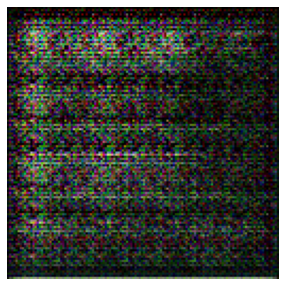

********************
 Epoch 0 and iteration 123 discriminator loss= 0.055523 generator loss= 6.147722


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


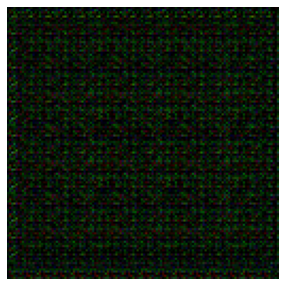

********************
 Epoch 1 and iteration 123 discriminator loss= 0.003665 generator loss= 8.656163


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


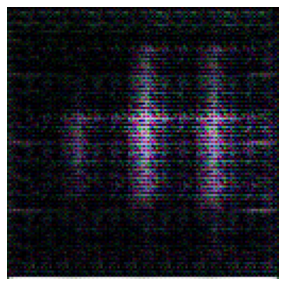

********************
 Epoch 2 and iteration 123 discriminator loss= 0.086713 generator loss= 6.382864


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


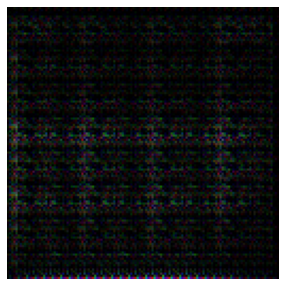

********************
 Epoch 3 and iteration 123 discriminator loss= 0.068027 generator loss= 9.239300


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


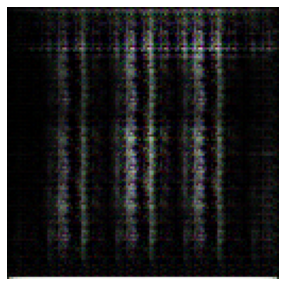

********************
 Epoch 4 and iteration 123 discriminator loss= 0.413751 generator loss= 4.852802


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


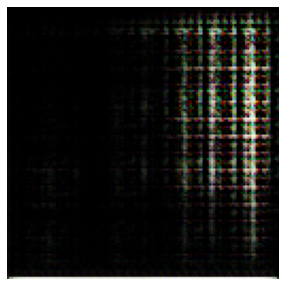

********************
 Epoch 5 and iteration 123 discriminator loss= 0.194868 generator loss= 7.335848


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


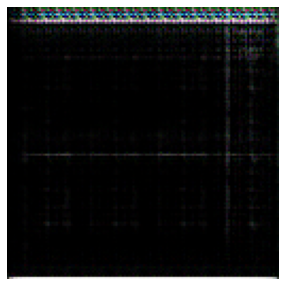

********************
 Epoch 6 and iteration 123 discriminator loss= 0.156105 generator loss= 6.512971


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


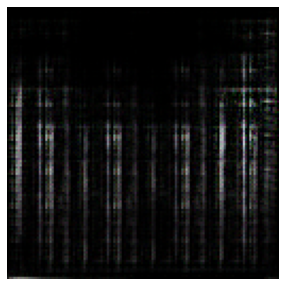

********************
 Epoch 7 and iteration 123 discriminator loss= 0.252496 generator loss= 8.710288


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


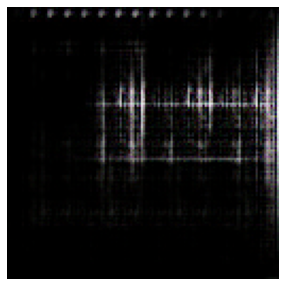

********************
 Epoch 8 and iteration 123 discriminator loss= 0.048371 generator loss= 5.527722


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


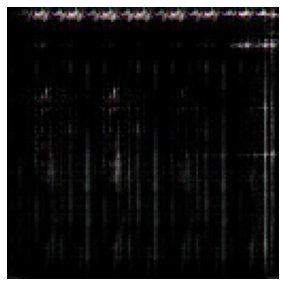

********************
 Epoch 9 and iteration 123 discriminator loss= 0.137023 generator loss= 5.646479


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


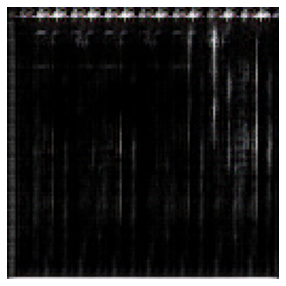

********************
 Epoch 10 and iteration 123 discriminator loss= 0.298633 generator loss= 7.367092


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


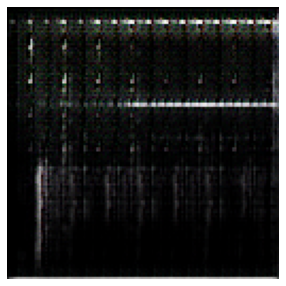

********************
 Epoch 11 and iteration 123 discriminator loss= 0.130947 generator loss= 8.815192


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


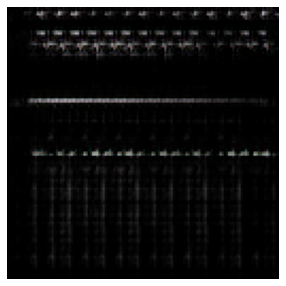

********************
 Epoch 12 and iteration 123 discriminator loss= 0.102810 generator loss= 8.761021


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


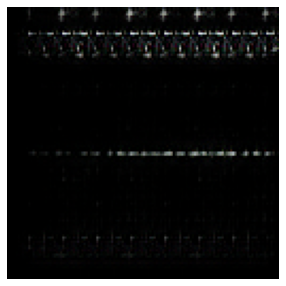

********************
 Epoch 13 and iteration 123 discriminator loss= 0.337908 generator loss= 10.165193


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


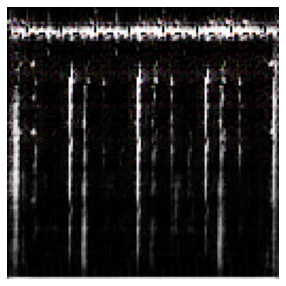

********************
 Epoch 14 and iteration 123 discriminator loss= 0.083264 generator loss= 4.778787


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


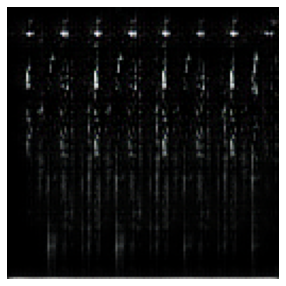

********************
 Epoch 15 and iteration 123 discriminator loss= 0.181333 generator loss= 4.986182


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


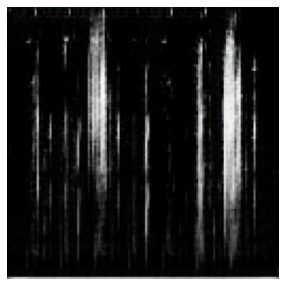

********************
 Epoch 16 and iteration 123 discriminator loss= 0.962611 generator loss= 9.318840


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


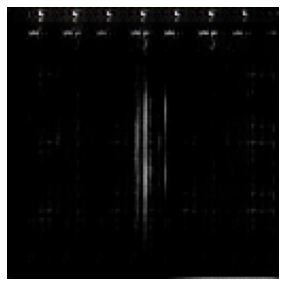

********************
 Epoch 17 and iteration 123 discriminator loss= 0.067822 generator loss= 5.824616


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


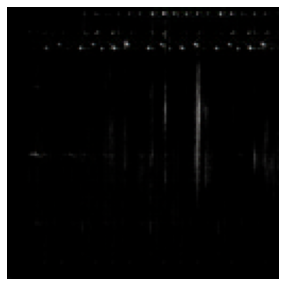

********************
 Epoch 18 and iteration 123 discriminator loss= 0.206264 generator loss= 5.386835


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


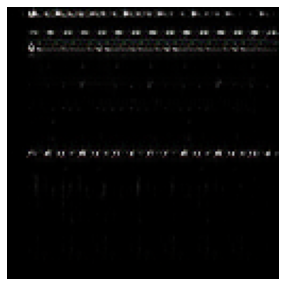

********************
 Epoch 19 and iteration 123 discriminator loss= 0.676083 generator loss= 2.222714


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


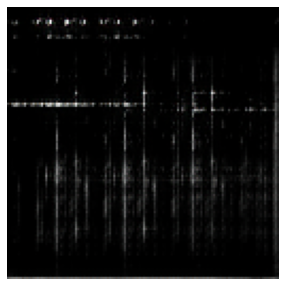

********************
 Epoch 20 and iteration 123 discriminator loss= 0.269561 generator loss= 6.545539


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


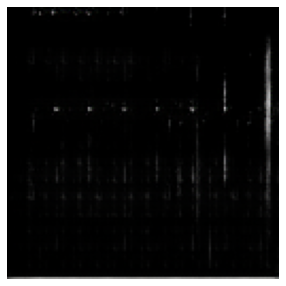

********************
 Epoch 21 and iteration 123 discriminator loss= 0.026806 generator loss= 5.466548


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


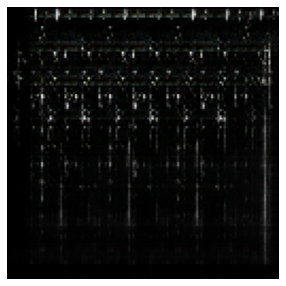

********************
 Epoch 22 and iteration 123 discriminator loss= 0.091980 generator loss= 4.663776


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


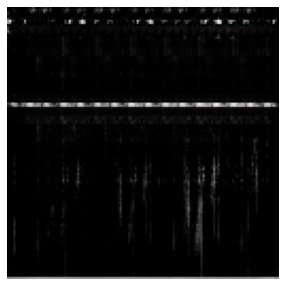

********************
 Epoch 23 and iteration 123 discriminator loss= 0.102767 generator loss= 5.741908


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


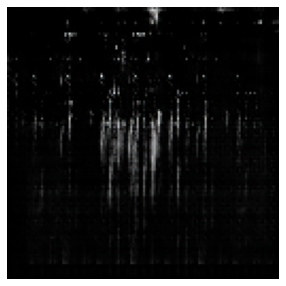

********************
 Epoch 24 and iteration 123 discriminator loss= 0.028726 generator loss= 5.680783


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


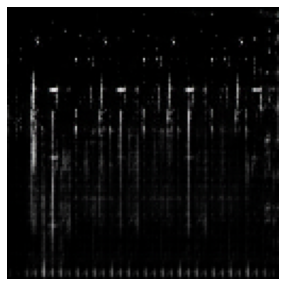

********************
 Epoch 25 and iteration 123 discriminator loss= 0.693325 generator loss= 19.074133


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


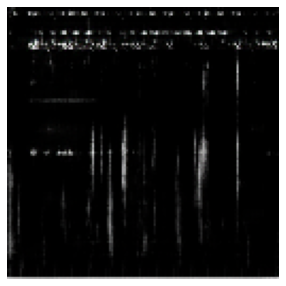

********************
 Epoch 26 and iteration 123 discriminator loss= 0.148384 generator loss= 7.771788


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


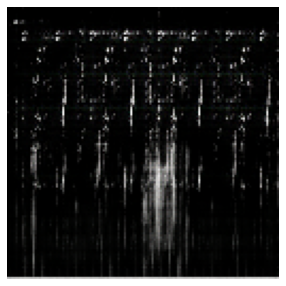

********************
 Epoch 27 and iteration 123 discriminator loss= 0.098687 generator loss= 5.559109


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


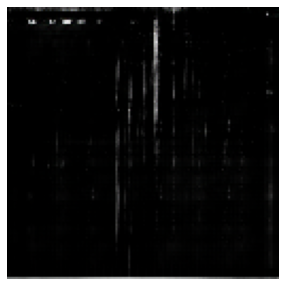

********************
 Epoch 28 and iteration 123 discriminator loss= 0.159758 generator loss= 7.319424


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


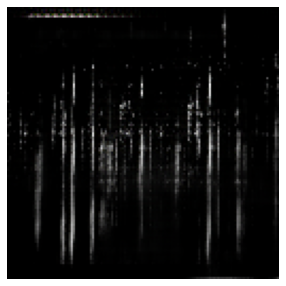

********************
 Epoch 29 and iteration 123 discriminator loss= 1.208183 generator loss= 5.410782


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


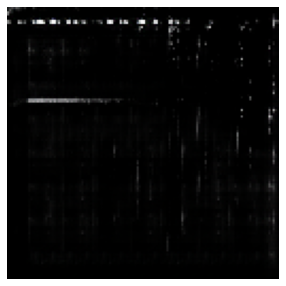

********************
 Epoch 30 and iteration 123 discriminator loss= 0.264988 generator loss= 5.750959


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


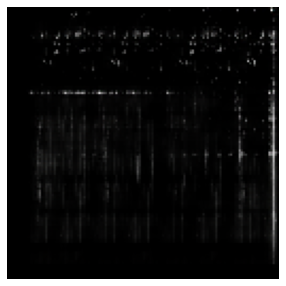

********************
 Epoch 31 and iteration 123 discriminator loss= 0.179947 generator loss= 7.258765


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


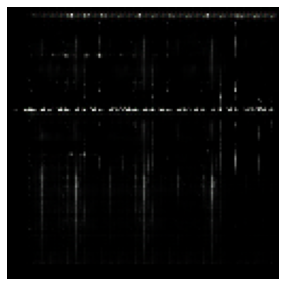

********************
 Epoch 32 and iteration 123 discriminator loss= 0.101188 generator loss= 5.010045


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


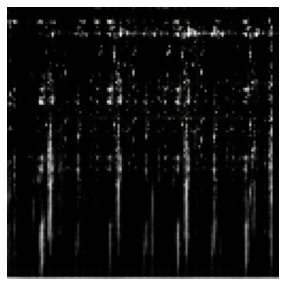

********************
 Epoch 33 and iteration 123 discriminator loss= 0.233485 generator loss= 5.457476


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


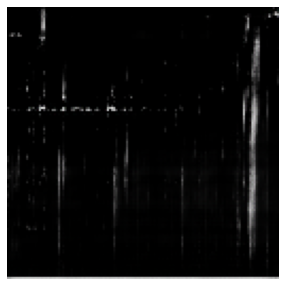

********************
 Epoch 34 and iteration 123 discriminator loss= 0.488881 generator loss= 9.177263


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


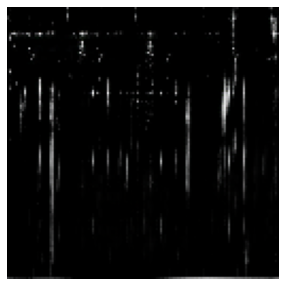

********************
 Epoch 35 and iteration 123 discriminator loss= 0.212229 generator loss= 10.209745


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


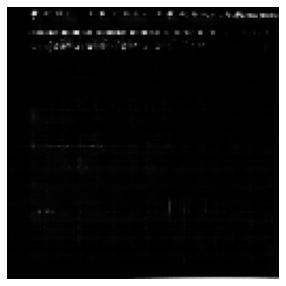

********************
 Epoch 36 and iteration 123 discriminator loss= 0.094795 generator loss= 6.161865


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


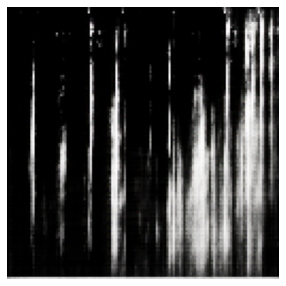

********************
 Epoch 37 and iteration 123 discriminator loss= 0.291849 generator loss= 7.573580


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


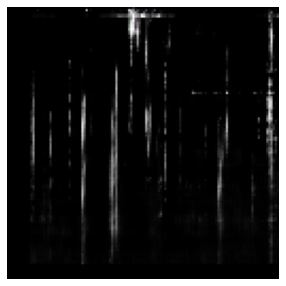

********************
 Epoch 38 and iteration 123 discriminator loss= 0.208159 generator loss= 6.050335


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


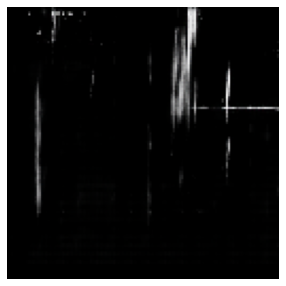

********************
 Epoch 39 and iteration 123 discriminator loss= 0.302117 generator loss= 6.864864


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


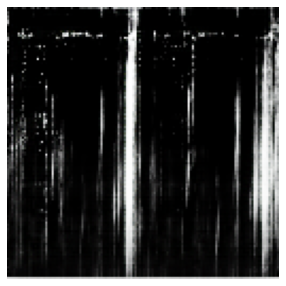

********************
 Epoch 40 and iteration 123 discriminator loss= 0.082042 generator loss= 7.764131


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


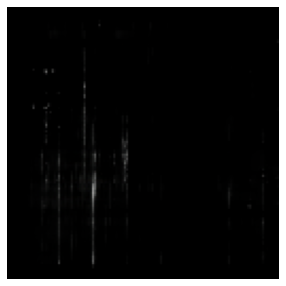

********************
 Epoch 41 and iteration 123 discriminator loss= 0.096813 generator loss= 6.448628


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


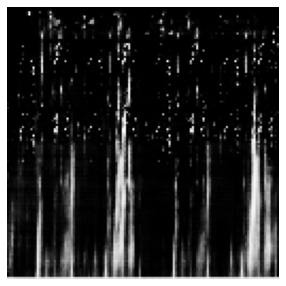

********************
 Epoch 42 and iteration 123 discriminator loss= 0.854806 generator loss= 5.958063


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


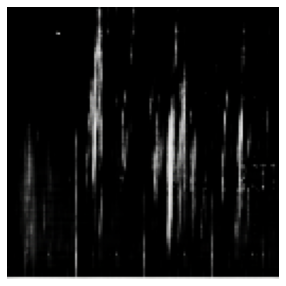

********************
 Epoch 43 and iteration 123 discriminator loss= 0.288655 generator loss= 5.441389


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


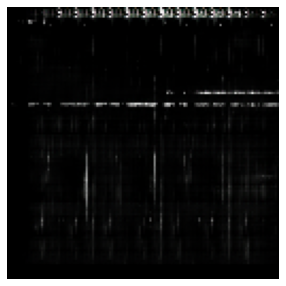

********************
 Epoch 44 and iteration 123 discriminator loss= 0.284032 generator loss= 8.845557


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


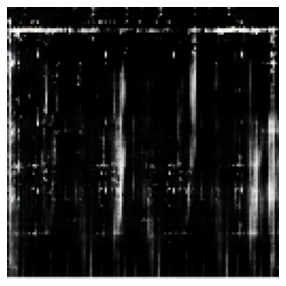

********************
 Epoch 45 and iteration 123 discriminator loss= 0.273273 generator loss= 5.963854


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


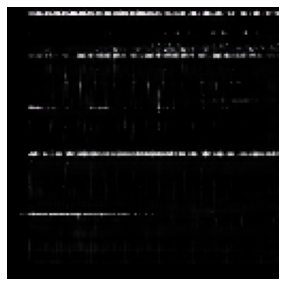

********************
 Epoch 46 and iteration 123 discriminator loss= 0.111824 generator loss= 5.035610


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


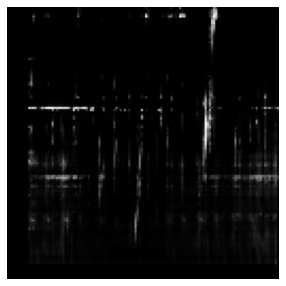

********************
 Epoch 47 and iteration 123 discriminator loss= 0.210157 generator loss= 7.171816


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


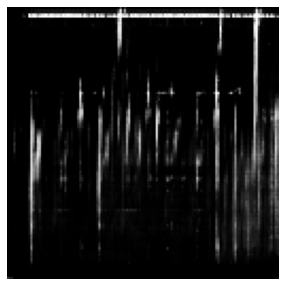

********************
 Epoch 48 and iteration 123 discriminator loss= 0.225860 generator loss= 4.073028


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


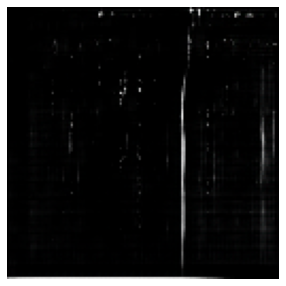

********************
 Epoch 49 and iteration 123 discriminator loss= 0.046237 generator loss= 6.430651


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


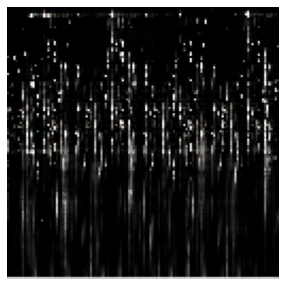

********************
 Epoch 50 and iteration 123 discriminator loss= 0.353818 generator loss= 5.195369


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


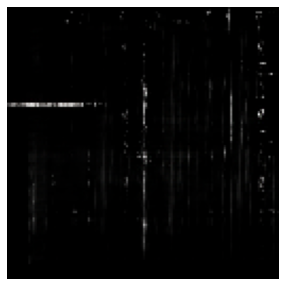

********************
 Epoch 51 and iteration 123 discriminator loss= 0.243799 generator loss= 5.018456


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


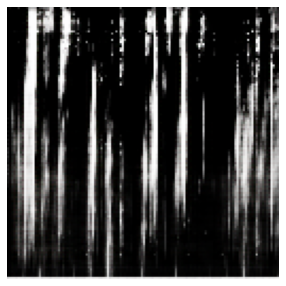

********************
 Epoch 52 and iteration 123 discriminator loss= 0.479127 generator loss= 8.785366


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


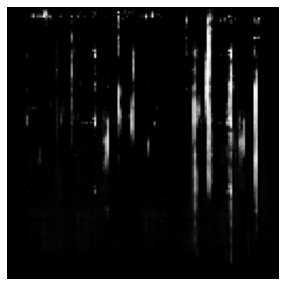

********************
 Epoch 53 and iteration 123 discriminator loss= 0.170809 generator loss= 3.472597


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


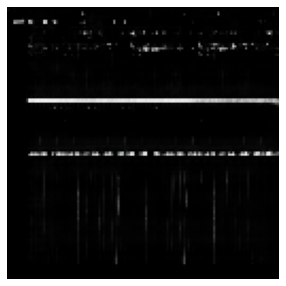

********************
 Epoch 54 and iteration 123 discriminator loss= 0.141877 generator loss= 5.539473


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


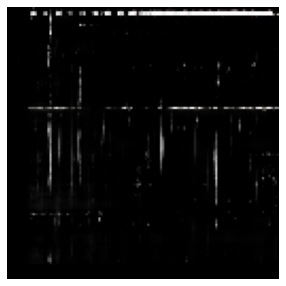

********************
 Epoch 55 and iteration 123 discriminator loss= 0.397982 generator loss= 3.602351


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


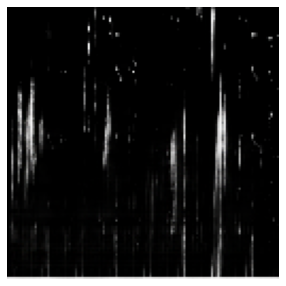

********************
 Epoch 56 and iteration 123 discriminator loss= 0.058504 generator loss= 5.814545


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


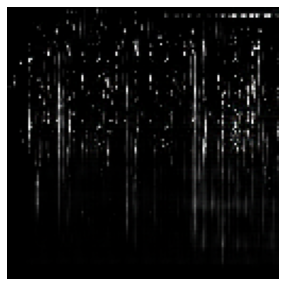

********************
 Epoch 57 and iteration 123 discriminator loss= 0.086508 generator loss= 5.319511


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


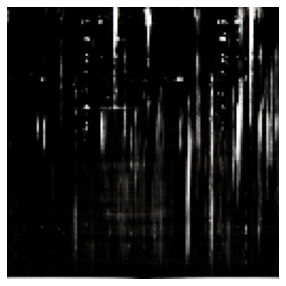

********************
 Epoch 58 and iteration 123 discriminator loss= 0.259968 generator loss= 3.944644


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


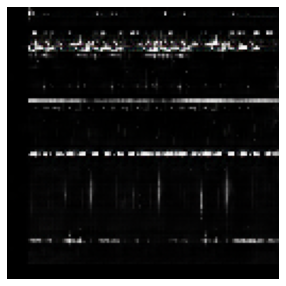

********************
 Epoch 59 and iteration 123 discriminator loss= 0.255929 generator loss= 5.173381


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


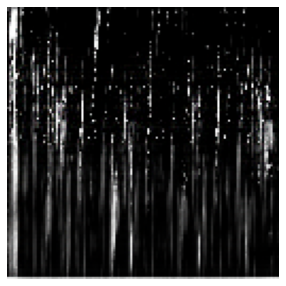

********************
 Epoch 60 and iteration 123 discriminator loss= 0.113895 generator loss= 6.281085


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


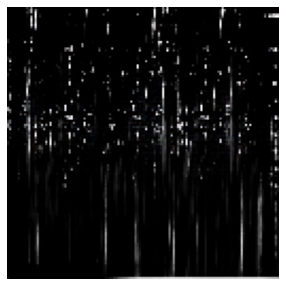

********************
 Epoch 61 and iteration 123 discriminator loss= 0.099782 generator loss= 6.017845


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


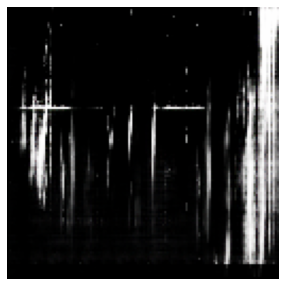

********************
 Epoch 62 and iteration 123 discriminator loss= 0.023665 generator loss= 7.709455


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


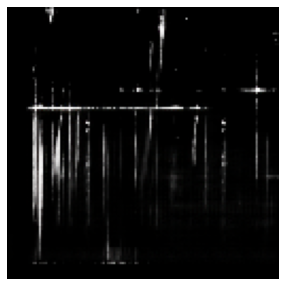

********************
 Epoch 63 and iteration 123 discriminator loss= 2.127144 generator loss= 0.689668


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


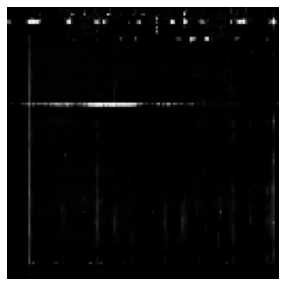

********************
 Epoch 64 and iteration 123 discriminator loss= 0.083062 generator loss= 8.525676


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


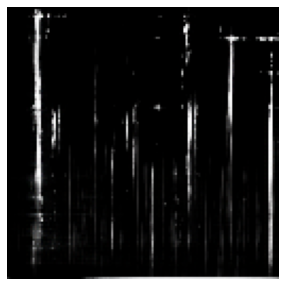

********************
 Epoch 65 and iteration 123 discriminator loss= 0.119672 generator loss= 4.971045


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


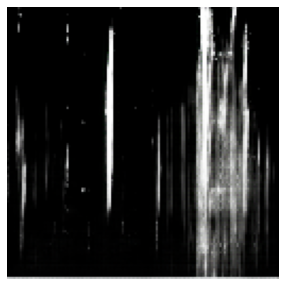

********************
 Epoch 66 and iteration 123 discriminator loss= 0.442691 generator loss= 6.313220


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


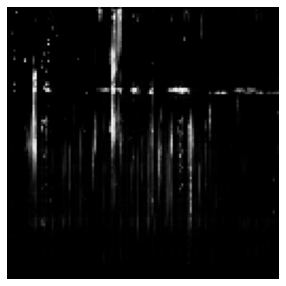

********************
 Epoch 67 and iteration 123 discriminator loss= 0.429243 generator loss= 7.066725


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


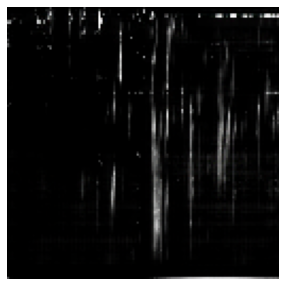

********************
 Epoch 68 and iteration 123 discriminator loss= 0.110465 generator loss= 6.478968


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


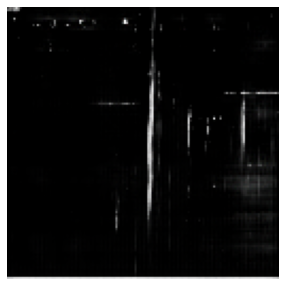

********************
 Epoch 69 and iteration 123 discriminator loss= 0.564349 generator loss= 8.277902


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


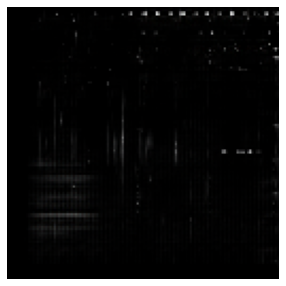

********************
 Epoch 70 and iteration 123 discriminator loss= 0.267315 generator loss= 7.296550


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


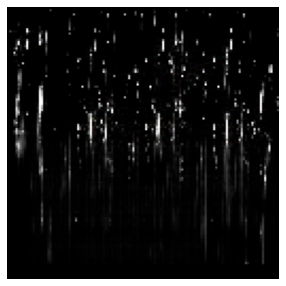

********************
 Epoch 71 and iteration 123 discriminator loss= 0.019468 generator loss= 7.869612


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


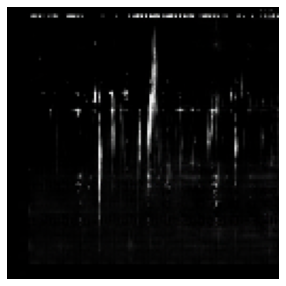

********************
 Epoch 72 and iteration 123 discriminator loss= 0.754078 generator loss= 14.886982


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


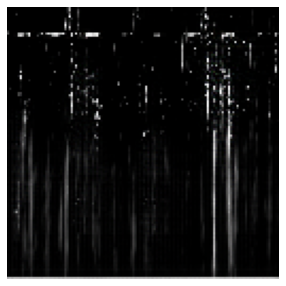

********************
 Epoch 73 and iteration 123 discriminator loss= 0.654896 generator loss= 9.340517


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


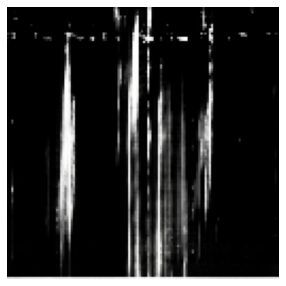

********************
 Epoch 74 and iteration 123 discriminator loss= 0.081501 generator loss= 6.673661


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


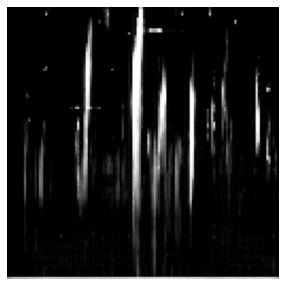

********************
 Epoch 75 and iteration 123 discriminator loss= 0.112126 generator loss= 6.109371


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


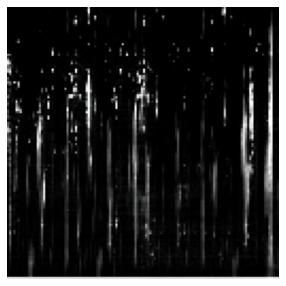

********************
 Epoch 76 and iteration 123 discriminator loss= 0.069314 generator loss= 9.332541


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


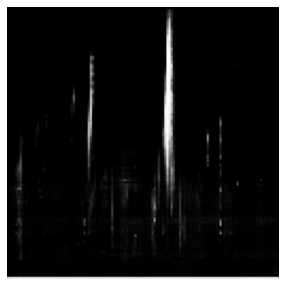

********************
 Epoch 77 and iteration 123 discriminator loss= 0.040036 generator loss= 6.879724


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


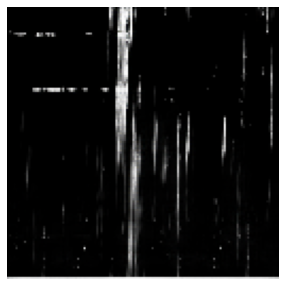

********************
 Epoch 78 and iteration 123 discriminator loss= 0.213101 generator loss= 5.645692


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


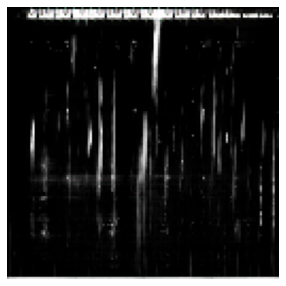

********************
 Epoch 79 and iteration 123 discriminator loss= 0.050781 generator loss= 7.083801


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


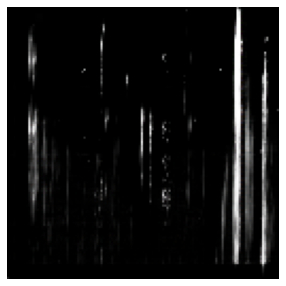

********************
 Epoch 80 and iteration 123 discriminator loss= 0.023924 generator loss= 7.351408


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


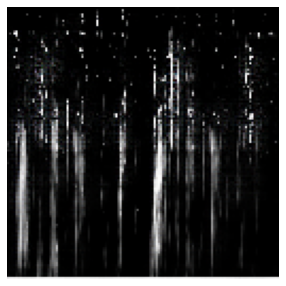

********************
 Epoch 81 and iteration 123 discriminator loss= 0.188737 generator loss= 6.760852


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


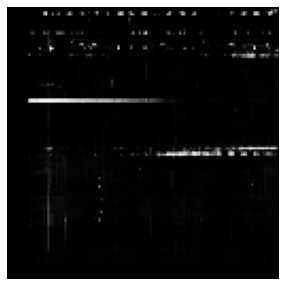

********************
 Epoch 82 and iteration 123 discriminator loss= 0.067811 generator loss= 7.343916


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


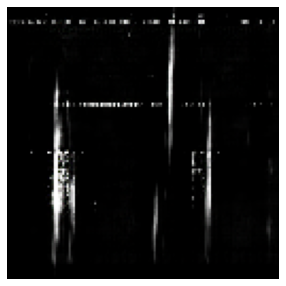

********************
 Epoch 83 and iteration 123 discriminator loss= 0.337808 generator loss= 8.923837


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


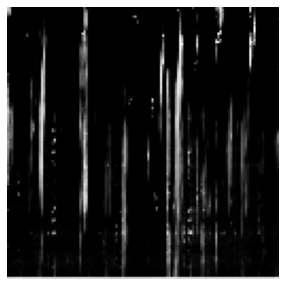

********************
 Epoch 84 and iteration 123 discriminator loss= 0.218098 generator loss= 8.533493


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


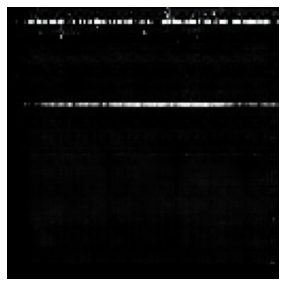

********************
 Epoch 85 and iteration 123 discriminator loss= 0.228473 generator loss= 10.341660


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


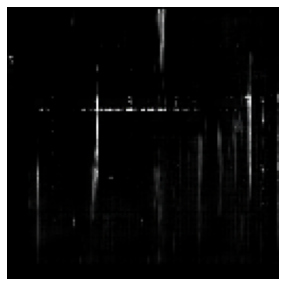

********************
 Epoch 86 and iteration 123 discriminator loss= 0.061642 generator loss= 10.377726


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


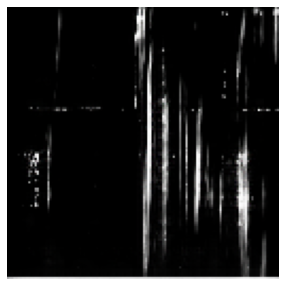

********************
 Epoch 87 and iteration 123 discriminator loss= 0.012140 generator loss= 7.138668


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


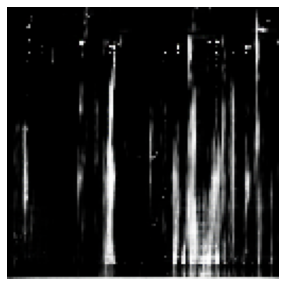

********************
 Epoch 88 and iteration 123 discriminator loss= 0.058542 generator loss= 9.371875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


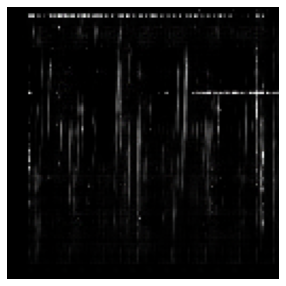

********************
 Epoch 89 and iteration 123 discriminator loss= 0.030128 generator loss= 5.809597


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


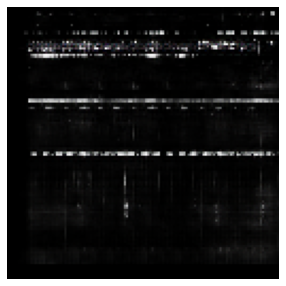

********************
 Epoch 90 and iteration 123 discriminator loss= 0.120637 generator loss= 7.513509


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


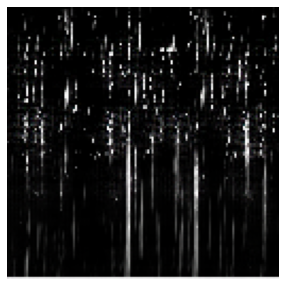

********************
 Epoch 91 and iteration 123 discriminator loss= 0.025266 generator loss= 8.164812


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


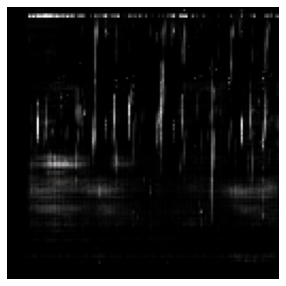

********************
 Epoch 92 and iteration 123 discriminator loss= 0.298061 generator loss= 14.958806


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


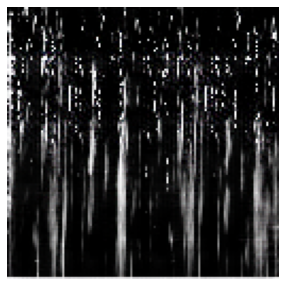

********************
 Epoch 93 and iteration 123 discriminator loss= 0.071082 generator loss= 9.419905


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


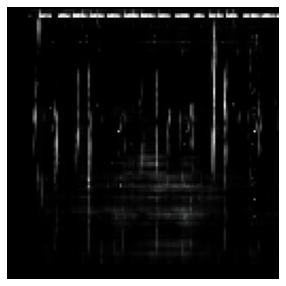

********************
 Epoch 94 and iteration 123 discriminator loss= 0.158226 generator loss= 6.282007


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


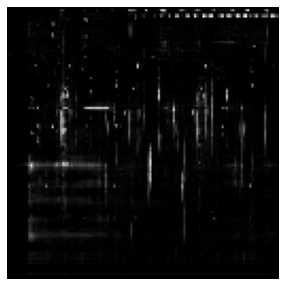

********************
 Epoch 95 and iteration 123 discriminator loss= 0.032326 generator loss= 6.461598


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


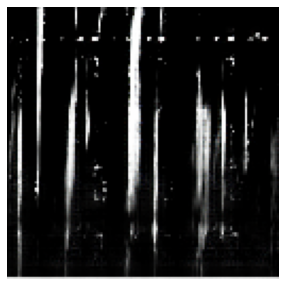

********************
 Epoch 96 and iteration 123 discriminator loss= 0.146935 generator loss= 9.414614


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


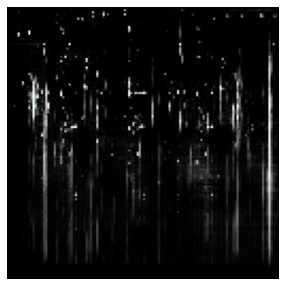

********************
 Epoch 97 and iteration 123 discriminator loss= 0.072113 generator loss= 6.377285


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


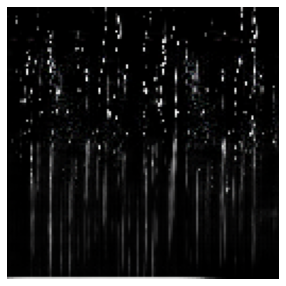

********************
 Epoch 98 and iteration 123 discriminator loss= 0.137775 generator loss= 9.884017


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


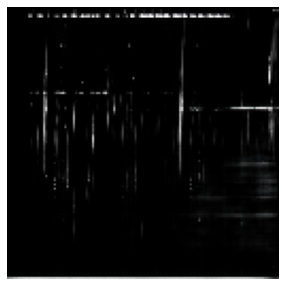

********************
 Epoch 99 and iteration 123 discriminator loss= 0.299657 generator loss= 7.569199


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


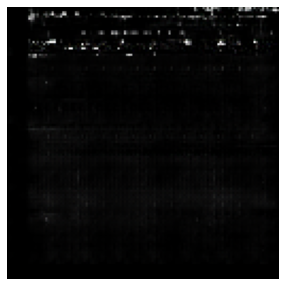

********************
 Epoch 100 and iteration 123 discriminator loss= 0.064690 generator loss= 9.421855


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


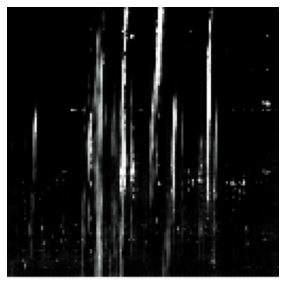

********************
 Epoch 101 and iteration 123 discriminator loss= 0.236160 generator loss= 8.583686


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


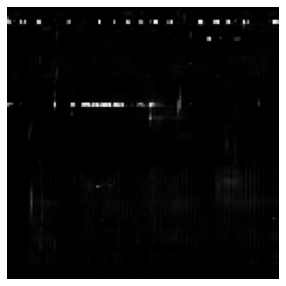

********************
 Epoch 102 and iteration 123 discriminator loss= 0.252140 generator loss= 11.029494


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


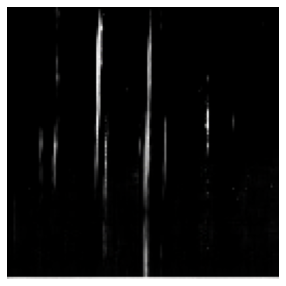

********************
 Epoch 103 and iteration 123 discriminator loss= 0.039937 generator loss= 10.259361


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


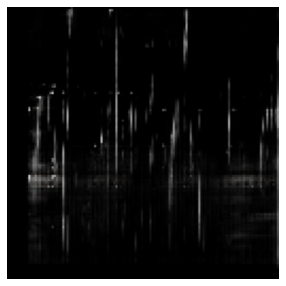

********************
 Epoch 104 and iteration 123 discriminator loss= 0.125664 generator loss= 5.959576


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


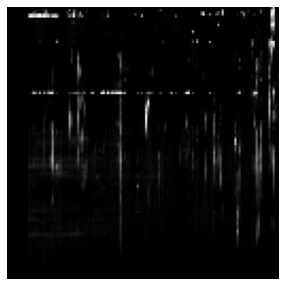

********************
 Epoch 105 and iteration 123 discriminator loss= 0.008842 generator loss= 8.872520


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


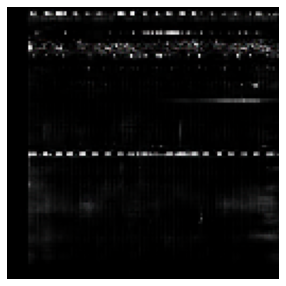

********************
 Epoch 106 and iteration 123 discriminator loss= 0.004496 generator loss= 10.618916


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


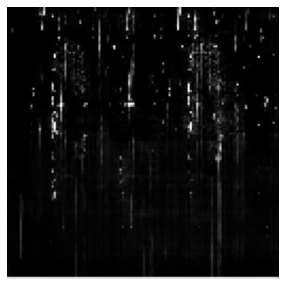

********************
 Epoch 107 and iteration 123 discriminator loss= 0.060233 generator loss= 6.568665


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


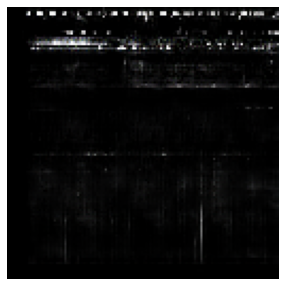

********************
 Epoch 108 and iteration 123 discriminator loss= 0.027310 generator loss= 8.219604


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


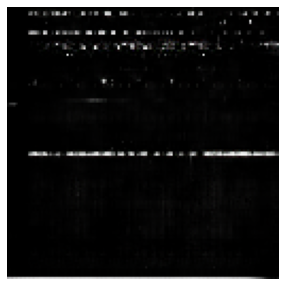

********************
 Epoch 109 and iteration 123 discriminator loss= 0.176744 generator loss= 8.016867


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


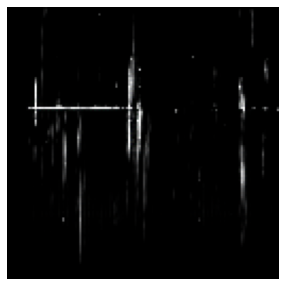

********************
 Epoch 110 and iteration 123 discriminator loss= 0.013615 generator loss= 8.439590


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


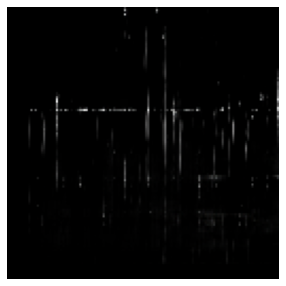

********************
 Epoch 111 and iteration 123 discriminator loss= 0.150966 generator loss= 6.324483


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


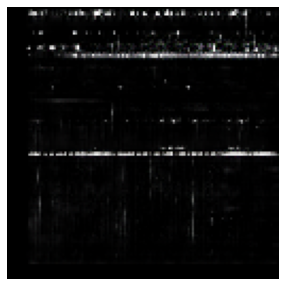

********************
 Epoch 112 and iteration 123 discriminator loss= 0.018409 generator loss= 9.296805


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


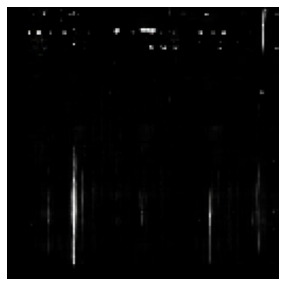

********************
 Epoch 113 and iteration 123 discriminator loss= 0.008238 generator loss= 8.140339


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


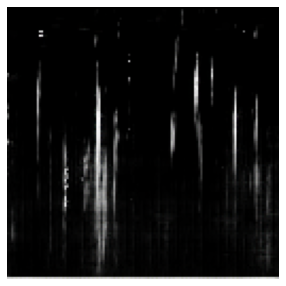

********************
 Epoch 114 and iteration 123 discriminator loss= 0.001577 generator loss= 8.958176


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


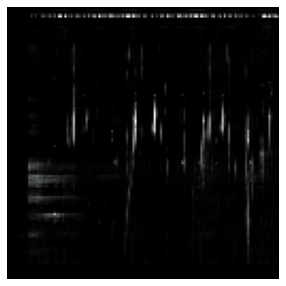

********************
 Epoch 115 and iteration 123 discriminator loss= 0.831814 generator loss= 29.099087


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


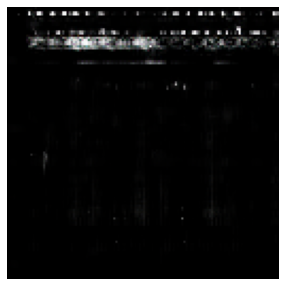

********************
 Epoch 116 and iteration 123 discriminator loss= 0.011530 generator loss= 9.334281


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


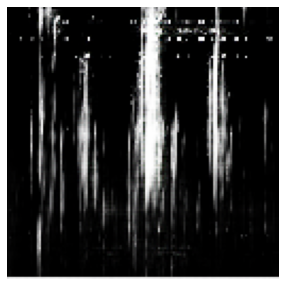

********************
 Epoch 117 and iteration 123 discriminator loss= 0.018376 generator loss= 7.170496


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


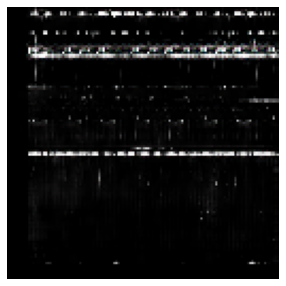

********************
 Epoch 118 and iteration 123 discriminator loss= 0.016598 generator loss= 6.202748


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


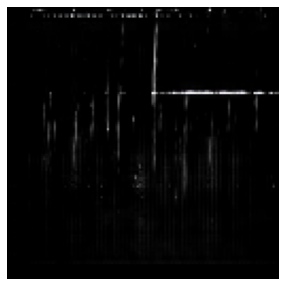

********************
 Epoch 119 and iteration 123 discriminator loss= 0.027544 generator loss= 6.823702


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


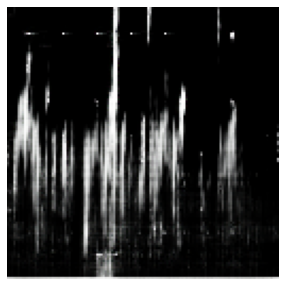

********************
 Epoch 120 and iteration 123 discriminator loss= 0.003050 generator loss= 9.643886


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


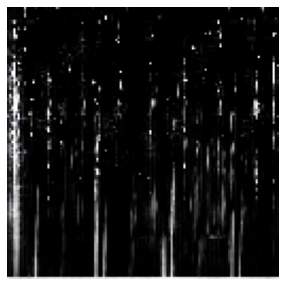

********************
 Epoch 121 and iteration 123 discriminator loss= 0.057647 generator loss= 8.113624


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


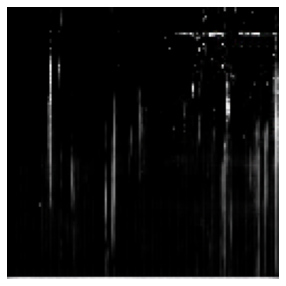

********************
 Epoch 122 and iteration 123 discriminator loss= 0.017805 generator loss= 9.149347


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


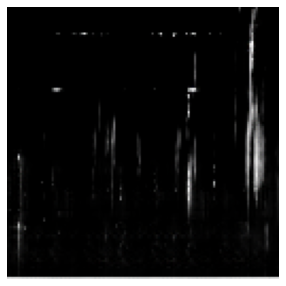

********************
 Epoch 123 and iteration 123 discriminator loss= 0.001714 generator loss= 8.799575


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


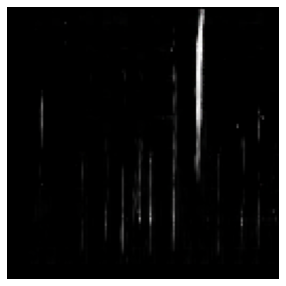

********************
 Epoch 124 and iteration 123 discriminator loss= 0.085337 generator loss= 8.036126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


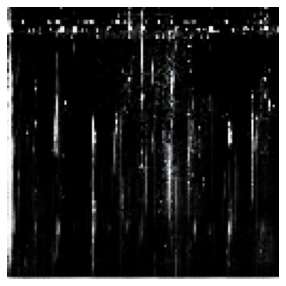

********************
 Epoch 125 and iteration 123 discriminator loss= 0.033571 generator loss= 8.747436


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


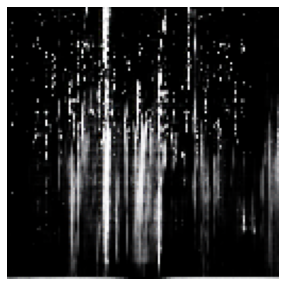

********************
 Epoch 126 and iteration 123 discriminator loss= 0.177213 generator loss= 5.120129


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


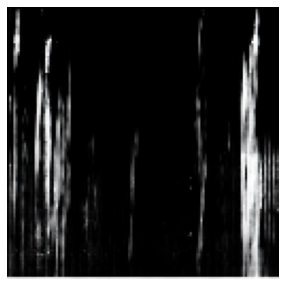

********************
 Epoch 127 and iteration 123 discriminator loss= 0.132984 generator loss= 6.436032


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


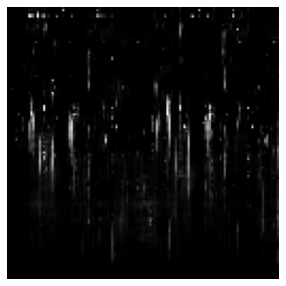

********************
 Epoch 128 and iteration 123 discriminator loss= 0.037375 generator loss= 7.294714


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


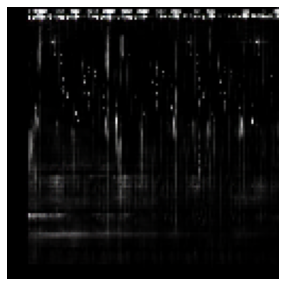

********************
 Epoch 129 and iteration 123 discriminator loss= 0.234781 generator loss= 13.709030


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


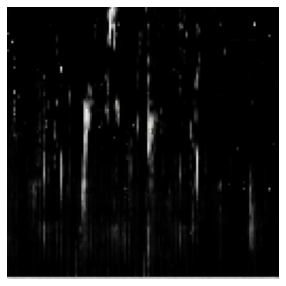

********************
 Epoch 130 and iteration 123 discriminator loss= 0.119370 generator loss= 7.129376


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


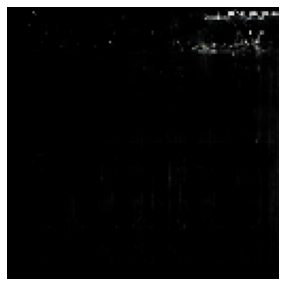

********************
 Epoch 131 and iteration 123 discriminator loss= 0.160145 generator loss= 5.323738


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


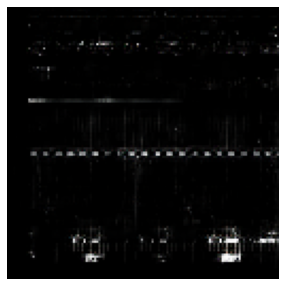

********************
 Epoch 132 and iteration 123 discriminator loss= 0.081166 generator loss= 6.772018


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


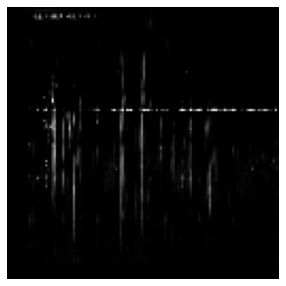

********************
 Epoch 133 and iteration 123 discriminator loss= 0.092005 generator loss= 7.550570


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


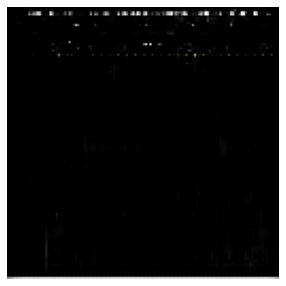

********************
 Epoch 134 and iteration 123 discriminator loss= 0.045030 generator loss= 8.580910


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


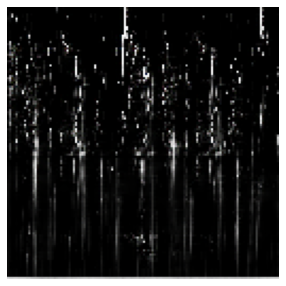

********************
 Epoch 135 and iteration 123 discriminator loss= 0.017811 generator loss= 7.582714


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


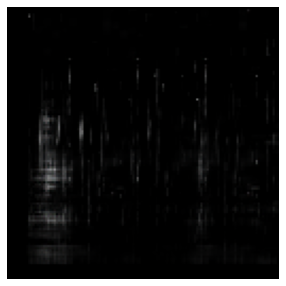

********************
 Epoch 136 and iteration 123 discriminator loss= 0.041445 generator loss= 8.218204


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


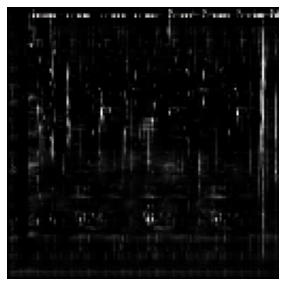

********************
 Epoch 137 and iteration 123 discriminator loss= 0.106539 generator loss= 5.916331


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


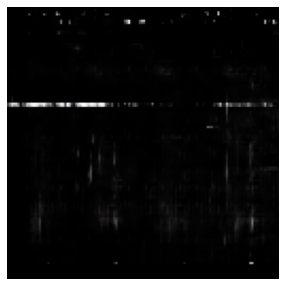

********************
 Epoch 138 and iteration 123 discriminator loss= 0.021954 generator loss= 8.162500


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


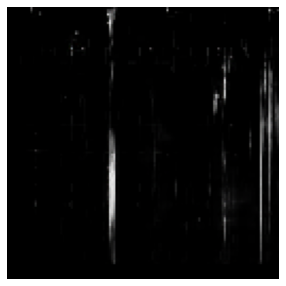

********************
 Epoch 139 and iteration 123 discriminator loss= 0.338274 generator loss= 1.900024


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


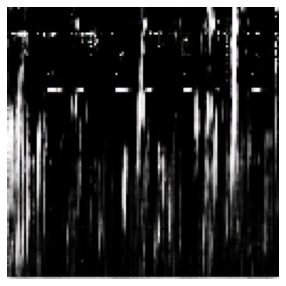

********************
 Epoch 140 and iteration 123 discriminator loss= 0.008029 generator loss= 7.313961


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


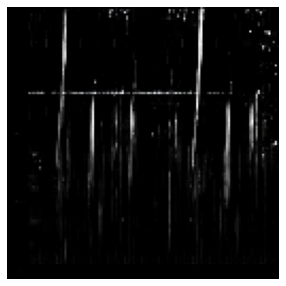

********************
 Epoch 141 and iteration 123 discriminator loss= 0.023115 generator loss= 6.919045


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


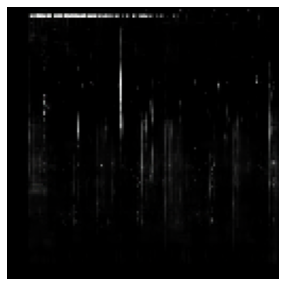

********************
 Epoch 142 and iteration 123 discriminator loss= 0.005993 generator loss= 14.059978


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


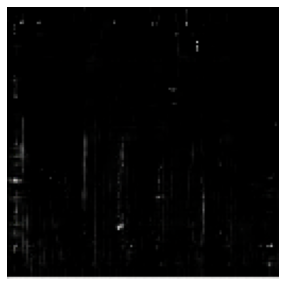

********************
 Epoch 143 and iteration 123 discriminator loss= 0.156651 generator loss= 8.804002


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


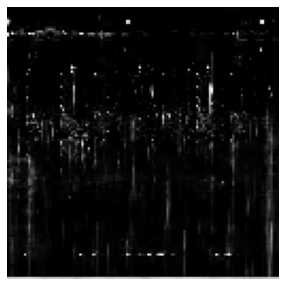

********************
 Epoch 144 and iteration 123 discriminator loss= 0.355652 generator loss= 7.166393


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


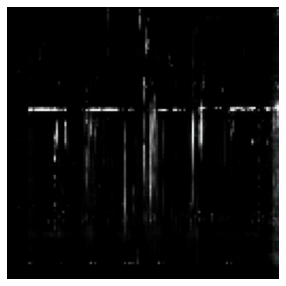

********************
 Epoch 145 and iteration 123 discriminator loss= 0.159542 generator loss= 15.124690


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


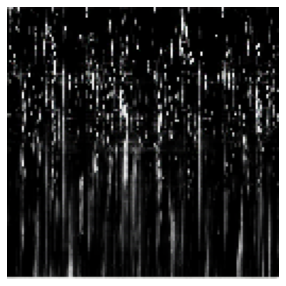

********************
 Epoch 146 and iteration 123 discriminator loss= 0.011877 generator loss= 8.760673


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


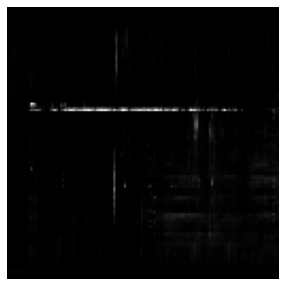

********************
 Epoch 147 and iteration 123 discriminator loss= 0.085560 generator loss= 10.393364


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


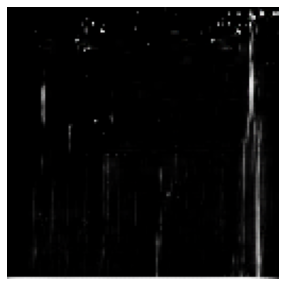

********************
 Epoch 148 and iteration 123 discriminator loss= 0.001271 generator loss= 21.816448


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


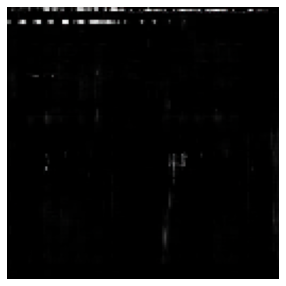

********************
 Epoch 149 and iteration 123 discriminator loss= 0.005118 generator loss= 9.305664


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


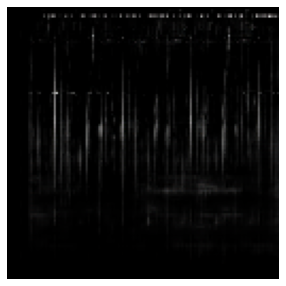

********************
 Epoch 150 and iteration 123 discriminator loss= 0.120167 generator loss= 7.137093


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


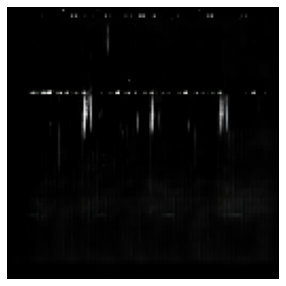

********************
 Epoch 151 and iteration 123 discriminator loss= 0.008940 generator loss= 10.517588


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


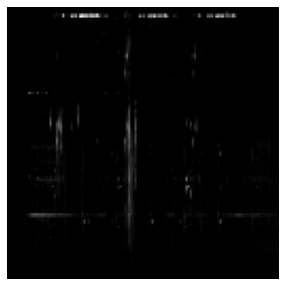

********************
 Epoch 152 and iteration 123 discriminator loss= 0.012926 generator loss= 6.314397


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


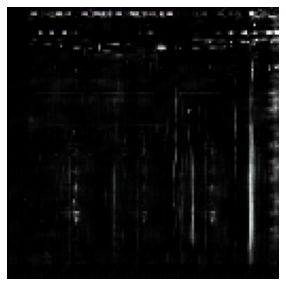

********************
 Epoch 153 and iteration 123 discriminator loss= 0.030096 generator loss= 6.844616


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


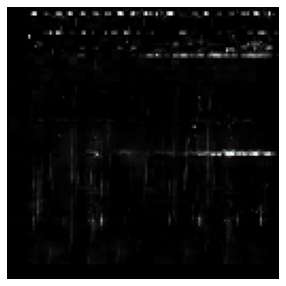

********************
 Epoch 154 and iteration 123 discriminator loss= 0.045935 generator loss= 7.835954


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


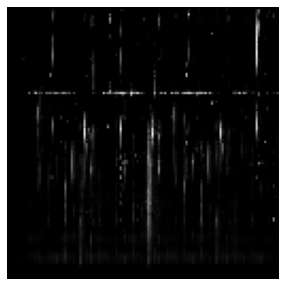

********************
 Epoch 155 and iteration 123 discriminator loss= 0.007761 generator loss= 6.843020


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


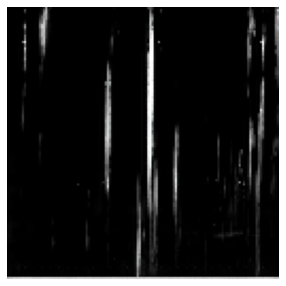

********************
 Epoch 156 and iteration 123 discriminator loss= 0.027128 generator loss= 6.739176


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


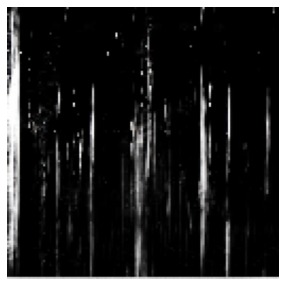

********************
 Epoch 157 and iteration 123 discriminator loss= 0.589128 generator loss= 5.148919


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


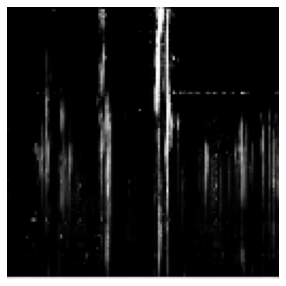

********************
 Epoch 158 and iteration 123 discriminator loss= 0.004998 generator loss= 8.259277


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


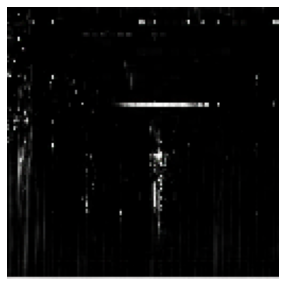

********************
 Epoch 159 and iteration 123 discriminator loss= 0.092295 generator loss= 6.315407


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


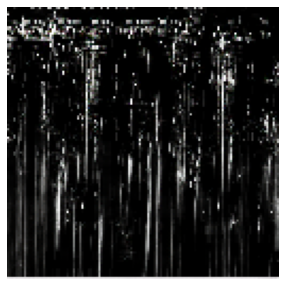

********************
 Epoch 160 and iteration 123 discriminator loss= 0.007147 generator loss= 7.116859


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


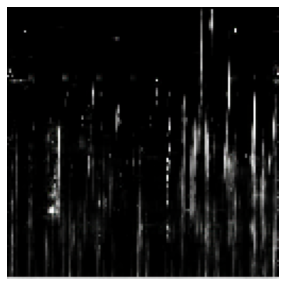

********************
 Epoch 161 and iteration 123 discriminator loss= 0.079402 generator loss= 9.135145


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


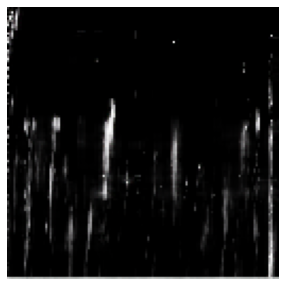

********************
 Epoch 162 and iteration 123 discriminator loss= 0.163184 generator loss= 5.187835


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


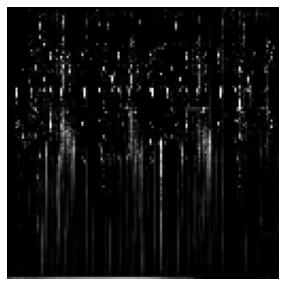

********************
 Epoch 163 and iteration 123 discriminator loss= 0.000401 generator loss= 21.797066


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


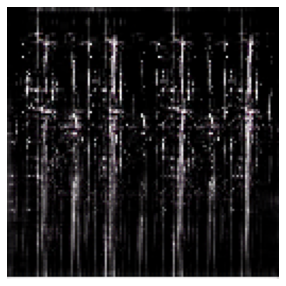

********************
 Epoch 164 and iteration 123 discriminator loss= 0.016069 generator loss= 10.269365


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


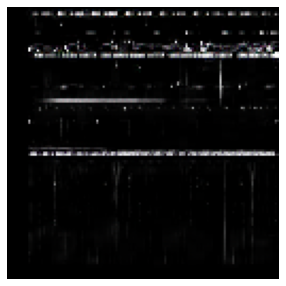

********************
 Epoch 165 and iteration 123 discriminator loss= 0.068137 generator loss= 6.619678


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


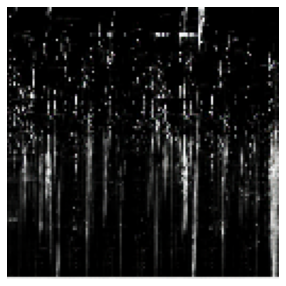

********************
 Epoch 166 and iteration 123 discriminator loss= 0.000659 generator loss= 14.197990


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


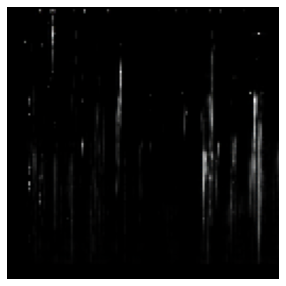

********************
 Epoch 167 and iteration 123 discriminator loss= 0.071414 generator loss= 7.361290


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


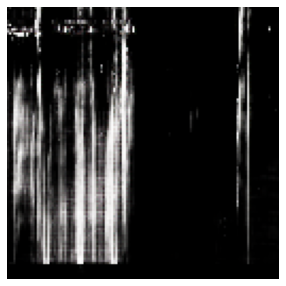

********************
 Epoch 168 and iteration 123 discriminator loss= 2.167212 generator loss= 32.997932


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


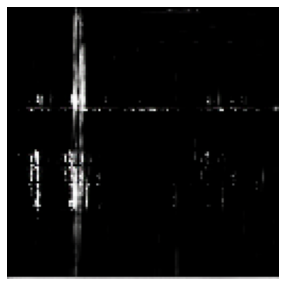

********************
 Epoch 169 and iteration 123 discriminator loss= 0.020969 generator loss= 16.120390


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


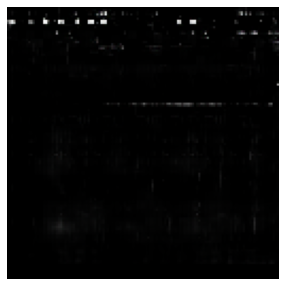

********************
 Epoch 170 and iteration 123 discriminator loss= 0.730730 generator loss= 9.190977


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


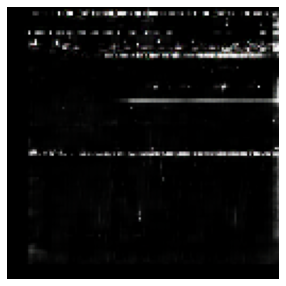

********************
 Epoch 171 and iteration 123 discriminator loss= 0.740794 generator loss= 2.300187


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


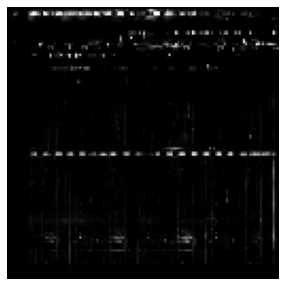

********************
 Epoch 172 and iteration 123 discriminator loss= 0.447384 generator loss= 14.628994


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


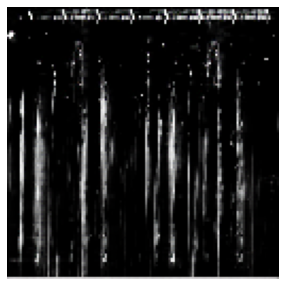

********************
 Epoch 173 and iteration 123 discriminator loss= 0.021068 generator loss= 6.617665


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


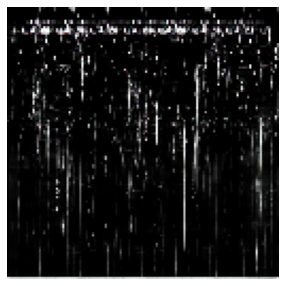

********************
 Epoch 174 and iteration 123 discriminator loss= 0.002551 generator loss= 10.753030


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


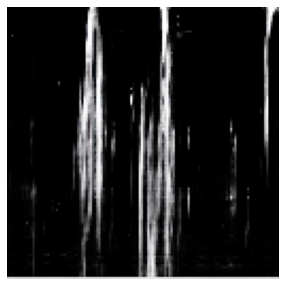

********************
 Epoch 175 and iteration 123 discriminator loss= 0.016473 generator loss= 13.394658


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


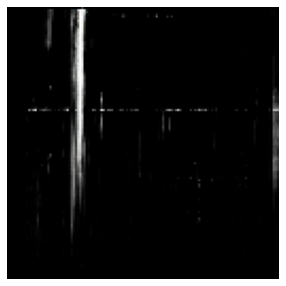

********************
 Epoch 176 and iteration 123 discriminator loss= 0.010663 generator loss= 7.776259


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


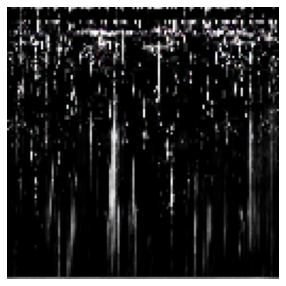

********************
 Epoch 177 and iteration 123 discriminator loss= 0.091148 generator loss= 8.489201


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


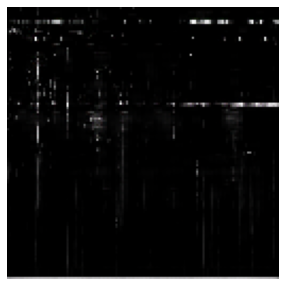

********************
 Epoch 178 and iteration 123 discriminator loss= 0.005654 generator loss= 8.416547


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


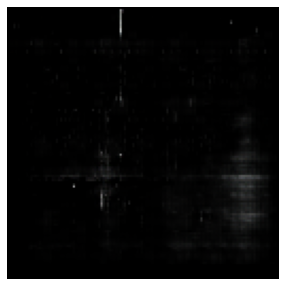

********************
 Epoch 179 and iteration 123 discriminator loss= 0.009150 generator loss= 8.135691


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


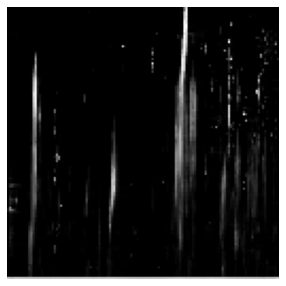

********************
 Epoch 180 and iteration 123 discriminator loss= 0.020489 generator loss= 7.911653


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


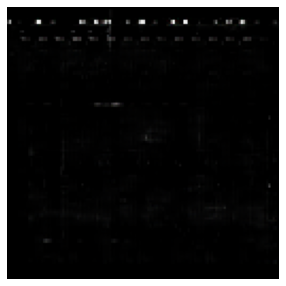

********************
 Epoch 181 and iteration 123 discriminator loss= 0.000451 generator loss= 20.505741


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


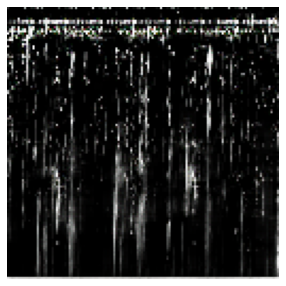

********************
 Epoch 182 and iteration 123 discriminator loss= 0.249898 generator loss= 15.956984


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


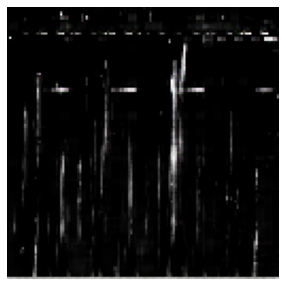

********************
 Epoch 183 and iteration 123 discriminator loss= 0.005101 generator loss= 10.093750


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


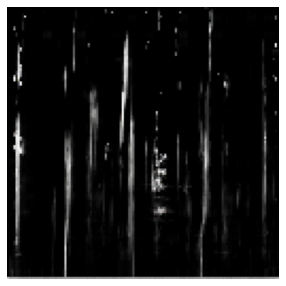

********************
 Epoch 184 and iteration 123 discriminator loss= 0.033756 generator loss= 6.517138


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


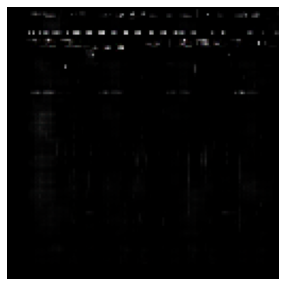

********************
 Epoch 185 and iteration 123 discriminator loss= 0.001427 generator loss= 12.234433


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


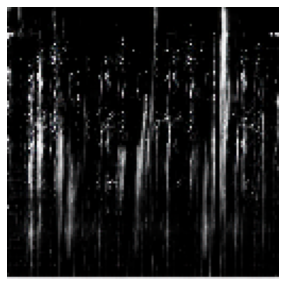

********************
 Epoch 186 and iteration 123 discriminator loss= 0.003774 generator loss= 8.859479


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


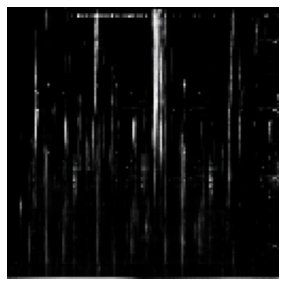

********************
 Epoch 187 and iteration 123 discriminator loss= 0.006734 generator loss= 9.376484


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


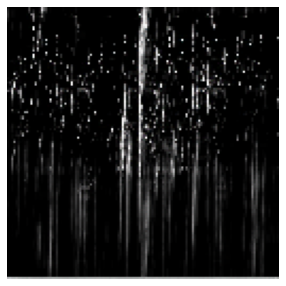

********************
 Epoch 188 and iteration 123 discriminator loss= 0.124318 generator loss= 7.536897


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


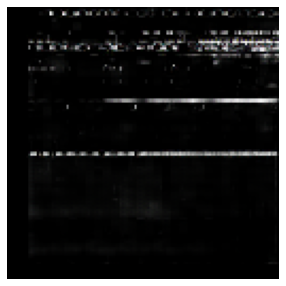

********************
 Epoch 189 and iteration 123 discriminator loss= 0.014339 generator loss= 8.141412


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


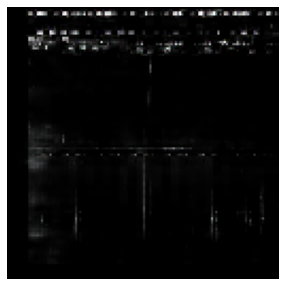

********************
 Epoch 190 and iteration 123 discriminator loss= 0.030393 generator loss= 13.380799


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


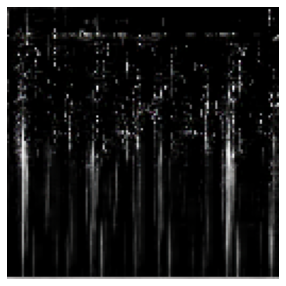

********************
 Epoch 191 and iteration 123 discriminator loss= 0.152606 generator loss= 10.116697


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


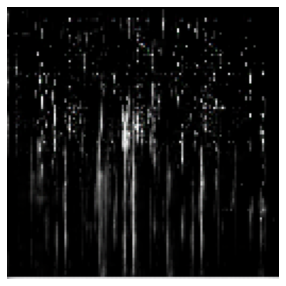

********************
 Epoch 192 and iteration 123 discriminator loss= 0.006181 generator loss= 8.593344


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


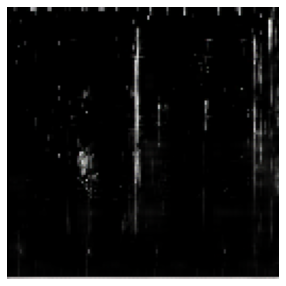

********************
 Epoch 193 and iteration 123 discriminator loss= 0.009563 generator loss= 18.451576


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


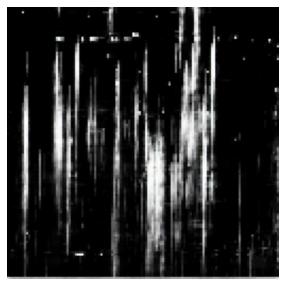

********************
 Epoch 194 and iteration 123 discriminator loss= 0.186279 generator loss= 6.018480


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


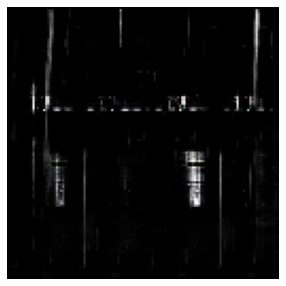

********************
 Epoch 195 and iteration 123 discriminator loss= 0.017994 generator loss= 10.302195


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


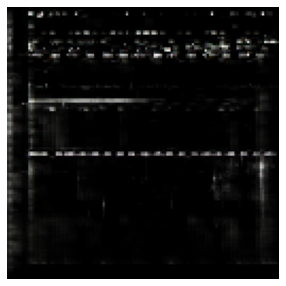

********************
 Epoch 196 and iteration 123 discriminator loss= 0.000039 generator loss= 34.437405


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


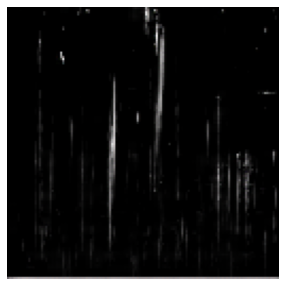

********************
 Epoch 197 and iteration 123 discriminator loss= 0.070709 generator loss= 8.484196


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


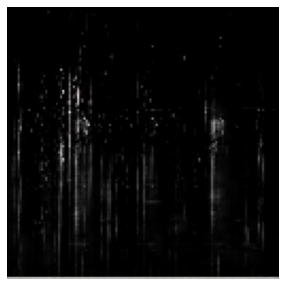

********************
 Epoch 198 and iteration 123 discriminator loss= 0.008029 generator loss= 10.135393


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


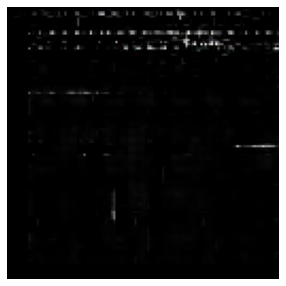

********************
 Epoch 199 and iteration 123 discriminator loss= 0.008046 generator loss= 11.027729


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


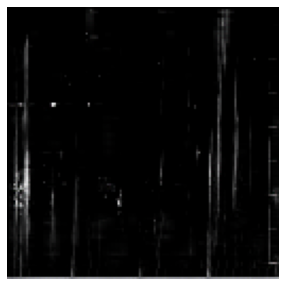

********************
 Epoch 200 and iteration 123 discriminator loss= 0.017037 generator loss= 8.800609


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


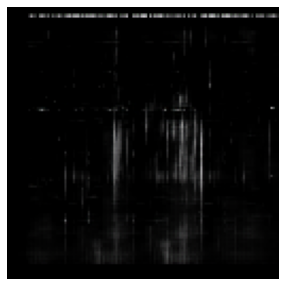

********************
 Epoch 201 and iteration 123 discriminator loss= 0.070268 generator loss= 7.647333


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


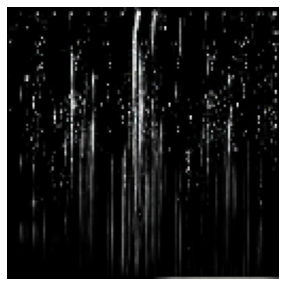

********************
 Epoch 202 and iteration 123 discriminator loss= 0.004174 generator loss= 11.019978


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


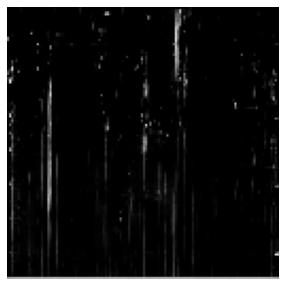

********************
 Epoch 203 and iteration 123 discriminator loss= 0.000931 generator loss= 9.186686


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


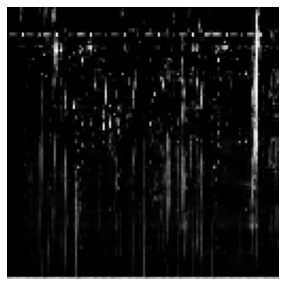

********************
 Epoch 204 and iteration 123 discriminator loss= 0.004470 generator loss= 7.663053


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


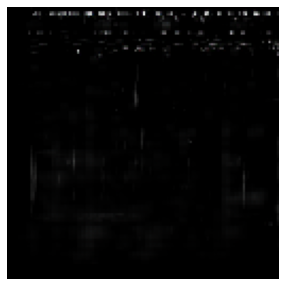

********************
 Epoch 205 and iteration 123 discriminator loss= 0.000142 generator loss= 19.905148


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


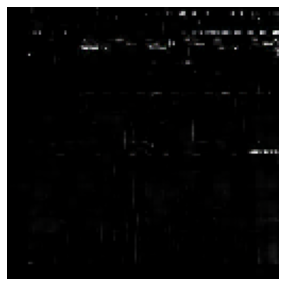

********************
 Epoch 206 and iteration 123 discriminator loss= 1.446478 generator loss= 0.516934


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


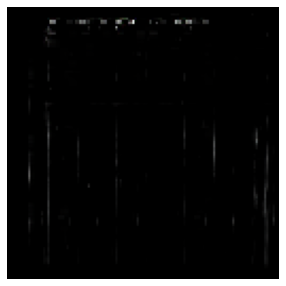

********************
 Epoch 207 and iteration 123 discriminator loss= 0.001167 generator loss= 9.655590


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


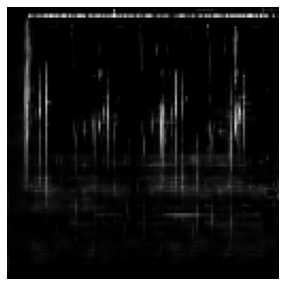

********************
 Epoch 208 and iteration 123 discriminator loss= 0.109242 generator loss= 7.609349


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


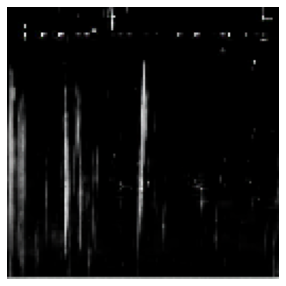

********************
 Epoch 209 and iteration 123 discriminator loss= 0.242033 generator loss= 12.324058


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


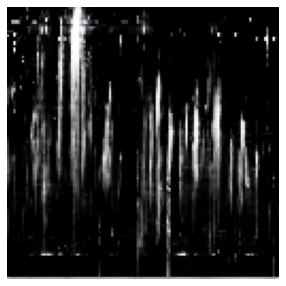

********************
 Epoch 210 and iteration 123 discriminator loss= 0.017592 generator loss= 24.764902


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


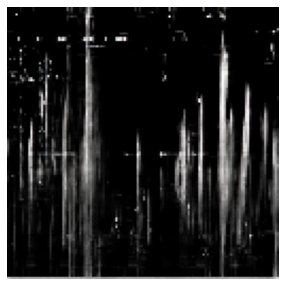

********************
 Epoch 211 and iteration 123 discriminator loss= 0.005925 generator loss= 9.422205


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


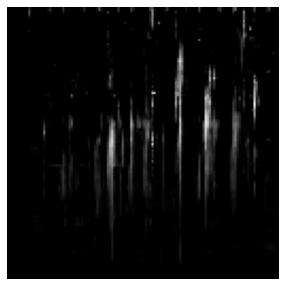

********************
 Epoch 212 and iteration 123 discriminator loss= 0.014417 generator loss= 6.027884


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


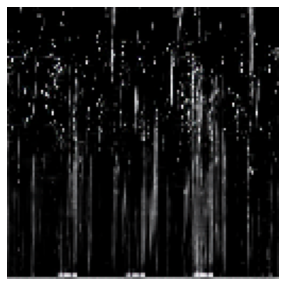

********************
 Epoch 213 and iteration 123 discriminator loss= 0.009523 generator loss= 7.754815


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


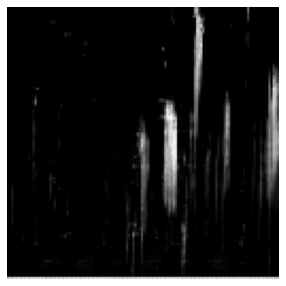

********************
 Epoch 214 and iteration 123 discriminator loss= 2.512331 generator loss= 40.610413


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


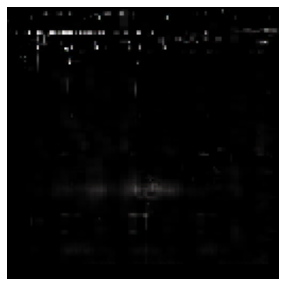

********************
 Epoch 215 and iteration 123 discriminator loss= 0.004647 generator loss= 10.515832


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


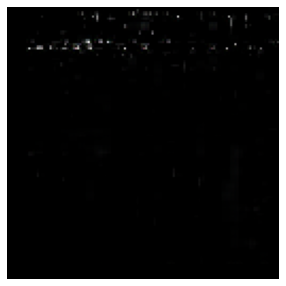

********************
 Epoch 216 and iteration 123 discriminator loss= 0.011283 generator loss= 11.000855


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


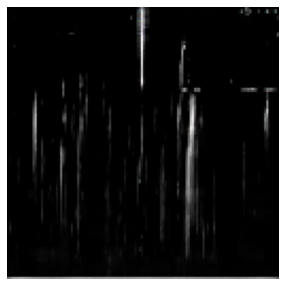

********************
 Epoch 217 and iteration 123 discriminator loss= 0.002959 generator loss= 13.863094


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


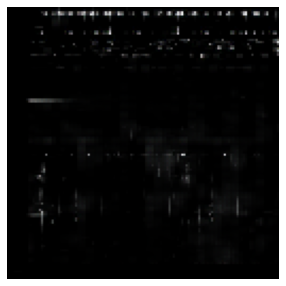

********************
 Epoch 218 and iteration 123 discriminator loss= 0.024167 generator loss= 30.771740


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


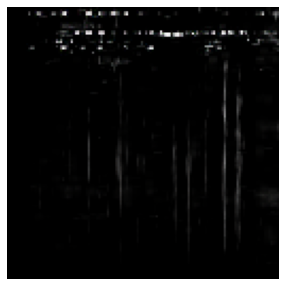

********************
 Epoch 219 and iteration 123 discriminator loss= 0.013070 generator loss= 16.524406


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


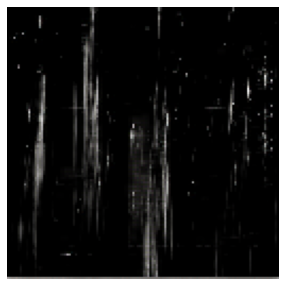

********************
 Epoch 220 and iteration 123 discriminator loss= 0.007121 generator loss= 15.953245


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


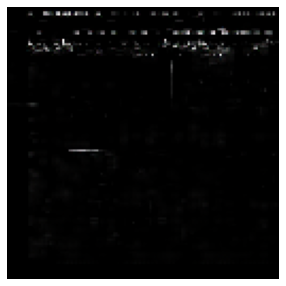

********************
 Epoch 221 and iteration 123 discriminator loss= 0.002360 generator loss= 13.759326


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


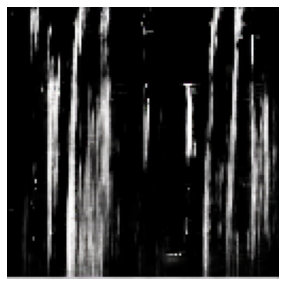

********************
 Epoch 222 and iteration 123 discriminator loss= 0.004360 generator loss= 15.276217


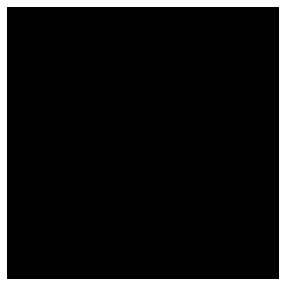

********************
 Epoch 223 and iteration 123 discriminator loss= 0.006820 generator loss= 8.038181


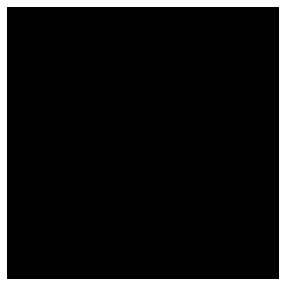

********************
 Epoch 224 and iteration 123 discriminator loss= 0.000037 generator loss= 17.871773


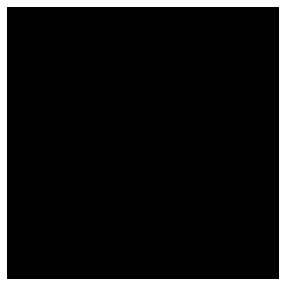

********************
 Epoch 225 and iteration 123 discriminator loss= 0.000300 generator loss= 11.593742


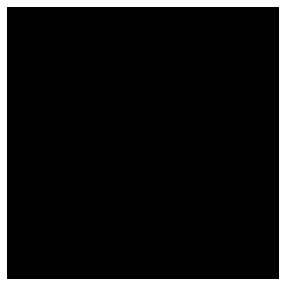

********************
 Epoch 226 and iteration 123 discriminator loss= 0.000419 generator loss= 8.618436


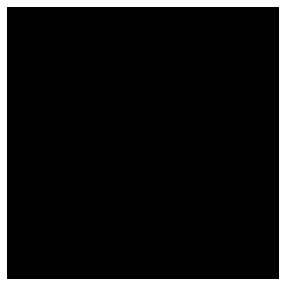

********************
 Epoch 227 and iteration 123 discriminator loss= 0.000164 generator loss= 9.061268


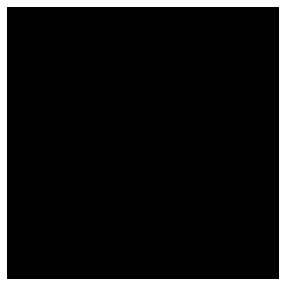

********************
 Epoch 228 and iteration 123 discriminator loss= 0.000560 generator loss= 12.042934


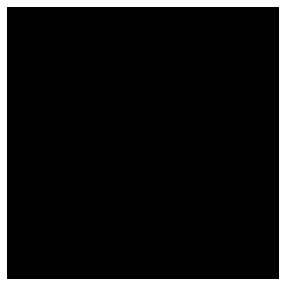

********************
 Epoch 229 and iteration 123 discriminator loss= 0.001040 generator loss= 9.851373


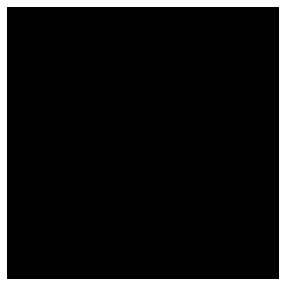

********************
 Epoch 230 and iteration 123 discriminator loss= 0.001399 generator loss= 8.575974


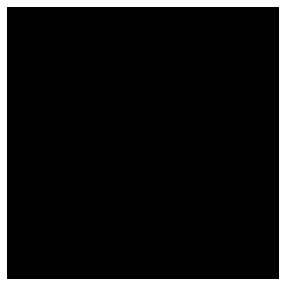

********************
 Epoch 231 and iteration 123 discriminator loss= 0.000159 generator loss= 9.684614


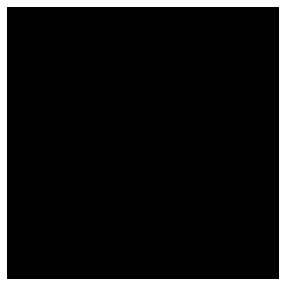

********************
 Epoch 232 and iteration 123 discriminator loss= 0.000401 generator loss= 62.236443


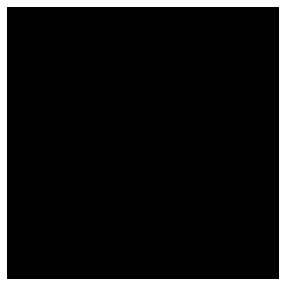

********************
 Epoch 233 and iteration 123 discriminator loss= 0.000499 generator loss= 10.439679


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


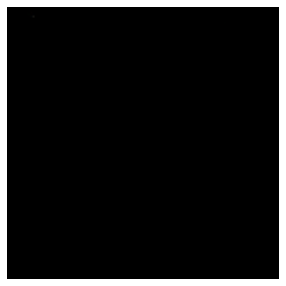

********************
 Epoch 234 and iteration 123 discriminator loss= 0.000001 generator loss= 16.358774


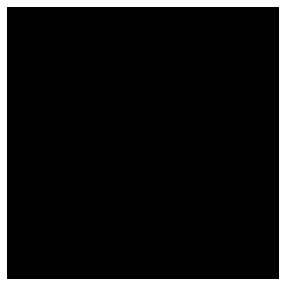

********************
 Epoch 235 and iteration 123 discriminator loss= 0.000847 generator loss= 9.237539


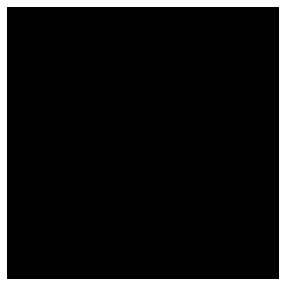

********************
 Epoch 236 and iteration 123 discriminator loss= 0.000017 generator loss= 13.436502


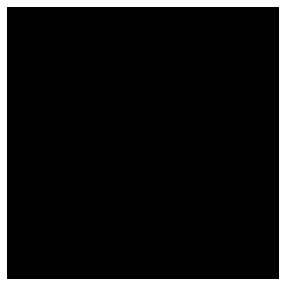

********************
 Epoch 237 and iteration 123 discriminator loss= 0.000005 generator loss= 15.095882


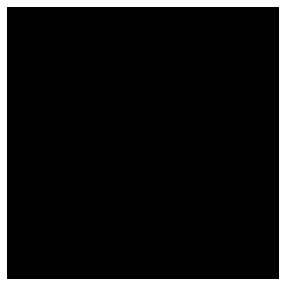

********************
 Epoch 238 and iteration 123 discriminator loss= 0.000281 generator loss= 8.971453


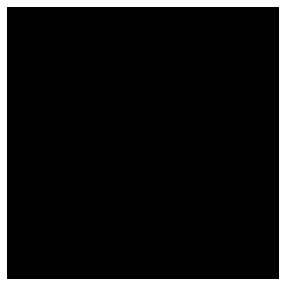

********************
 Epoch 239 and iteration 123 discriminator loss= 0.000029 generator loss= 12.620847


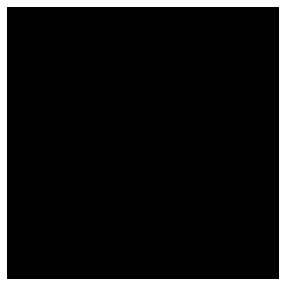

********************
 Epoch 240 and iteration 123 discriminator loss= 0.000019 generator loss= 10.957432


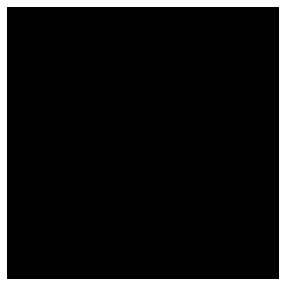

********************
 Epoch 241 and iteration 123 discriminator loss= 0.000071 generator loss= 9.658376


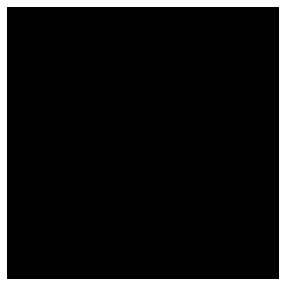

********************
 Epoch 242 and iteration 123 discriminator loss= 0.000041 generator loss= 10.250948


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


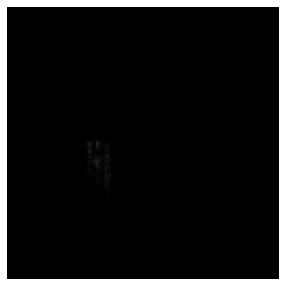

********************
 Epoch 243 and iteration 123 discriminator loss= 0.000000 generator loss= 28.011963


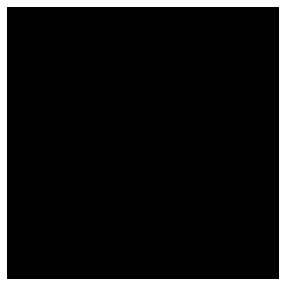

********************
 Epoch 244 and iteration 123 discriminator loss= 0.000003 generator loss= 12.910738


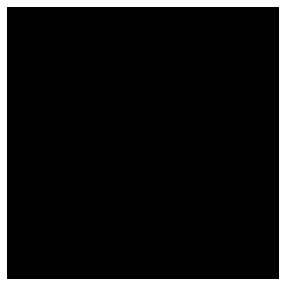

********************
 Epoch 245 and iteration 123 discriminator loss= 0.000045 generator loss= 10.327848


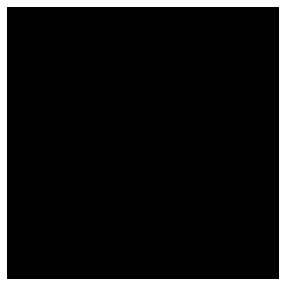

********************
 Epoch 246 and iteration 123 discriminator loss= 0.000061 generator loss= 9.817920


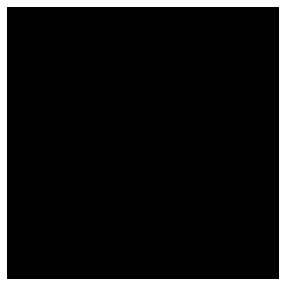

********************
 Epoch 247 and iteration 123 discriminator loss= 0.000069 generator loss= 9.610445


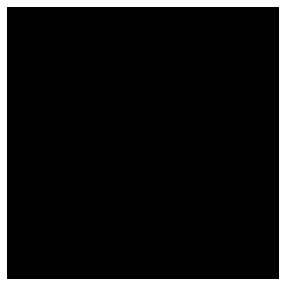

********************
 Epoch 248 and iteration 123 discriminator loss= 0.000052 generator loss= 10.363607


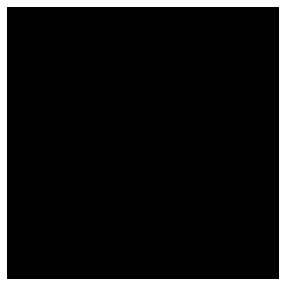

********************
 Epoch 249 and iteration 123 discriminator loss= 0.000000 generator loss= 20.526958


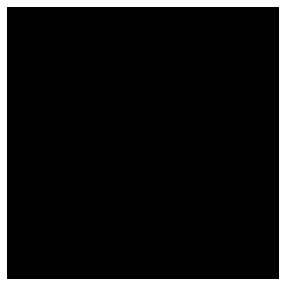

********************
 Epoch 250 and iteration 123 discriminator loss= 0.000037 generator loss= 10.453761


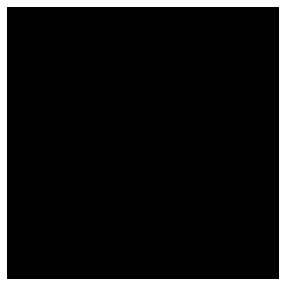

********************
 Epoch 251 and iteration 123 discriminator loss= 0.000024 generator loss= 13.855099


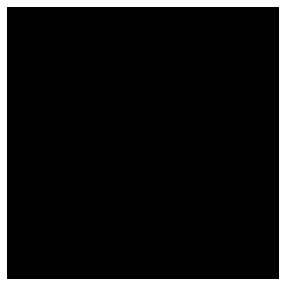

********************
 Epoch 252 and iteration 123 discriminator loss= 0.000000 generator loss= 17.949671


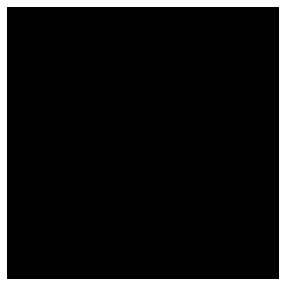

********************
 Epoch 253 and iteration 123 discriminator loss= 0.000002 generator loss= 17.174728


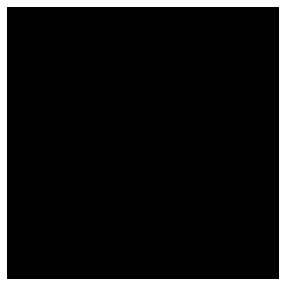

********************
 Epoch 254 and iteration 123 discriminator loss= 0.000036 generator loss= 13.792302


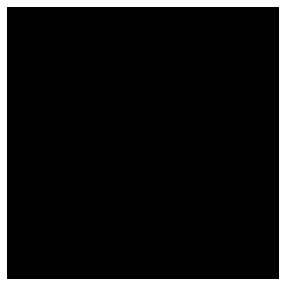

********************
 Epoch 255 and iteration 123 discriminator loss= 0.000005 generator loss= 16.049238


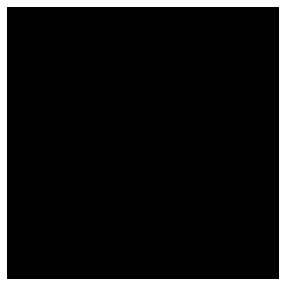

********************
 Epoch 256 and iteration 123 discriminator loss= 0.000002 generator loss= 17.590218


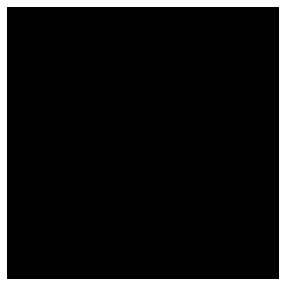

********************
 Epoch 257 and iteration 123 discriminator loss= 0.000016 generator loss= 14.584543


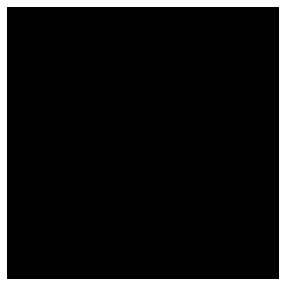

********************
 Epoch 258 and iteration 123 discriminator loss= 0.000000 generator loss= 22.730761


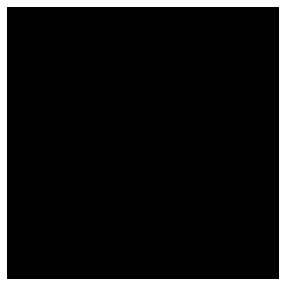

********************
 Epoch 259 and iteration 123 discriminator loss= 0.000032 generator loss= 13.596561


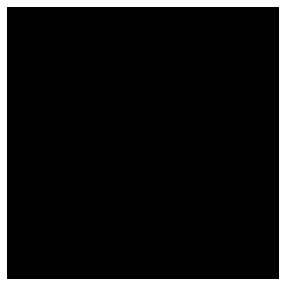

********************
 Epoch 260 and iteration 123 discriminator loss= 0.000019 generator loss= 13.254809


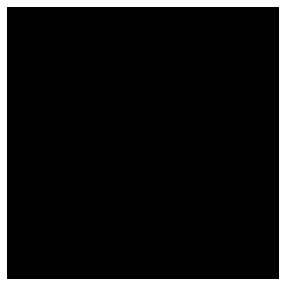

********************
 Epoch 261 and iteration 123 discriminator loss= 0.000025 generator loss= 12.722312


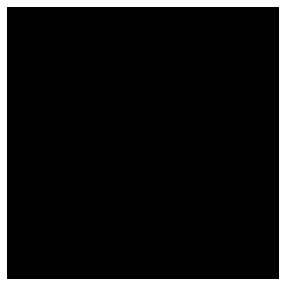

********************
 Epoch 262 and iteration 123 discriminator loss= 0.000015 generator loss= 13.719026


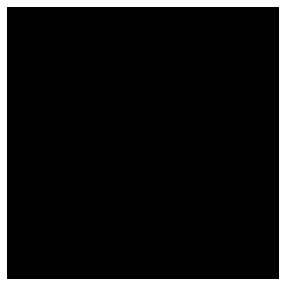

********************
 Epoch 263 and iteration 123 discriminator loss= 0.000013 generator loss= 13.347979


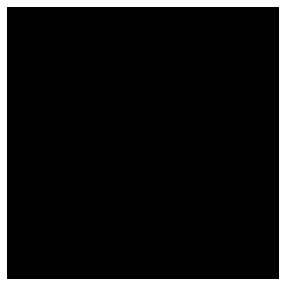

********************
 Epoch 264 and iteration 123 discriminator loss= 0.000011 generator loss= 13.658831


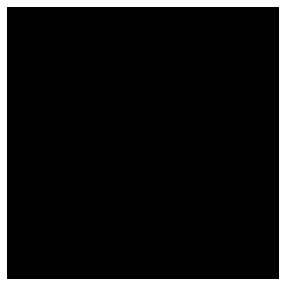

********************
 Epoch 265 and iteration 123 discriminator loss= 0.000000 generator loss= 17.572639


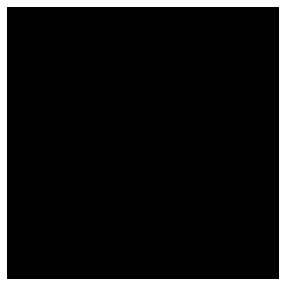

********************
 Epoch 266 and iteration 123 discriminator loss= 0.000023 generator loss= 13.845400


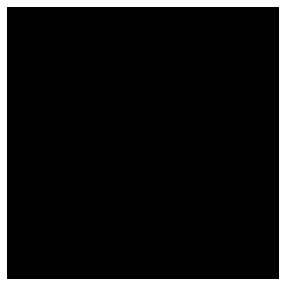

********************
 Epoch 267 and iteration 123 discriminator loss= 0.000007 generator loss= 14.457150


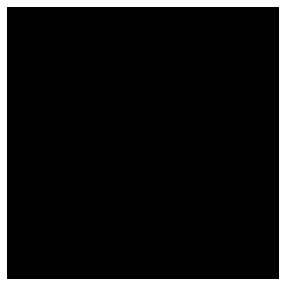

********************
 Epoch 268 and iteration 123 discriminator loss= 0.000001 generator loss= 16.449532


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


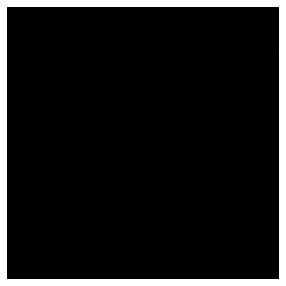

********************
 Epoch 269 and iteration 123 discriminator loss= 0.000001 generator loss= 16.335312


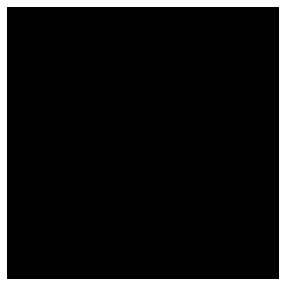

********************
 Epoch 270 and iteration 123 discriminator loss= 0.000008 generator loss= 13.737208


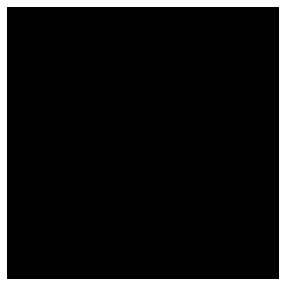

********************
 Epoch 271 and iteration 123 discriminator loss= 0.000001 generator loss= 15.407942


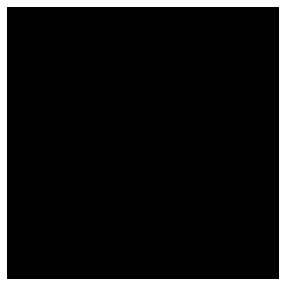

********************
 Epoch 272 and iteration 123 discriminator loss= 0.000000 generator loss= 17.572744


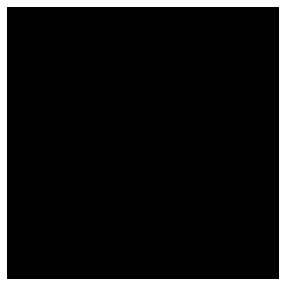

********************
 Epoch 273 and iteration 123 discriminator loss= 0.000016 generator loss= 13.316277


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


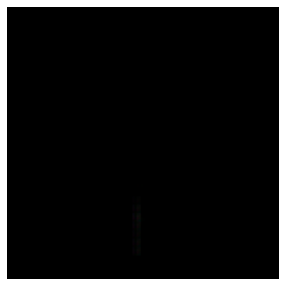

********************
 Epoch 274 and iteration 123 discriminator loss= 0.000008 generator loss= 13.849728


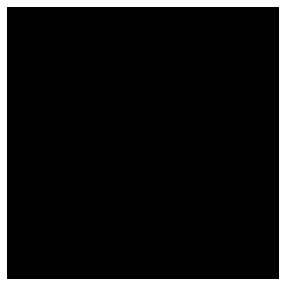

********************
 Epoch 275 and iteration 123 discriminator loss= 0.000001 generator loss= 15.943134


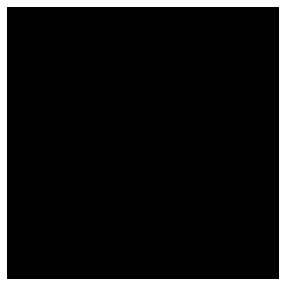

********************
 Epoch 276 and iteration 123 discriminator loss= 0.000001 generator loss= 16.188362


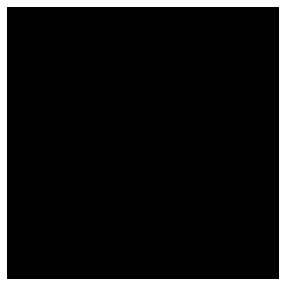

********************
 Epoch 277 and iteration 123 discriminator loss= 0.000005 generator loss= 14.388098


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


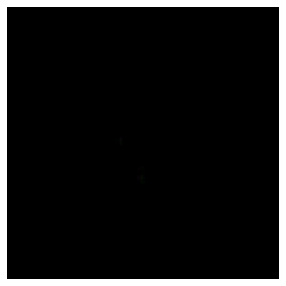

********************
 Epoch 278 and iteration 123 discriminator loss= 0.000001 generator loss= 16.302242


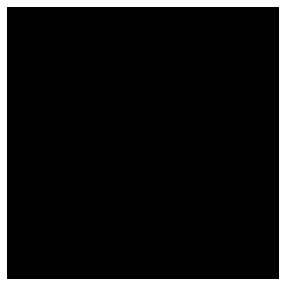

********************
 Epoch 279 and iteration 123 discriminator loss= 0.000000 generator loss= 17.119884


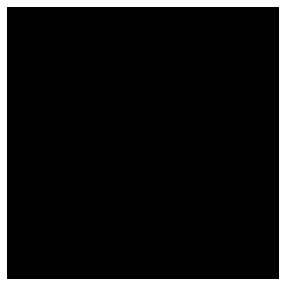

********************
 Epoch 280 and iteration 123 discriminator loss= 0.000002 generator loss= 15.139360


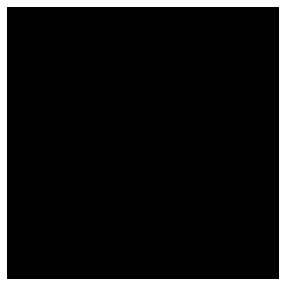

********************
 Epoch 281 and iteration 123 discriminator loss= 0.000003 generator loss= 14.583384


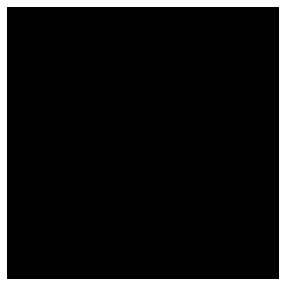

********************
 Epoch 282 and iteration 123 discriminator loss= 0.000003 generator loss= 14.644845


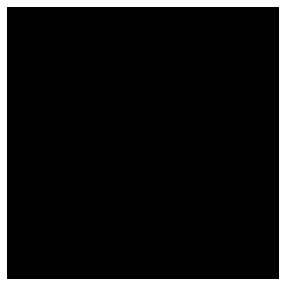

********************
 Epoch 283 and iteration 123 discriminator loss= 0.000001 generator loss= 19.582157


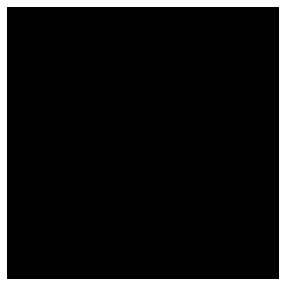

********************
 Epoch 284 and iteration 123 discriminator loss= 0.000003 generator loss= 15.109991


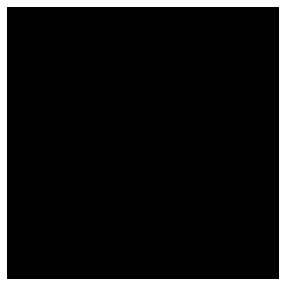

********************
 Epoch 285 and iteration 123 discriminator loss= 0.000000 generator loss= 19.820255


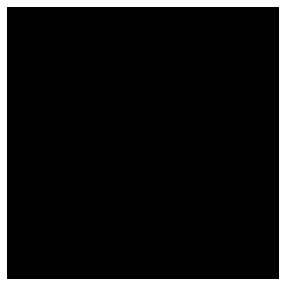

********************
 Epoch 286 and iteration 123 discriminator loss= 0.000002 generator loss= 15.852554


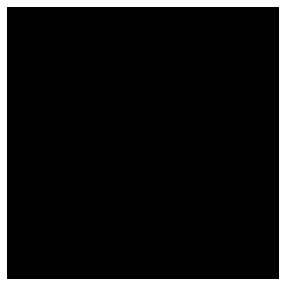

********************
 Epoch 287 and iteration 123 discriminator loss= 0.000001 generator loss= 16.433632


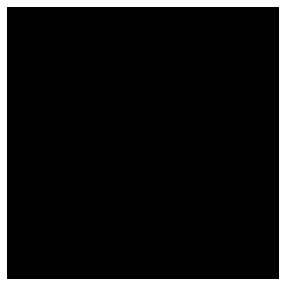

********************
 Epoch 288 and iteration 123 discriminator loss= 0.000001 generator loss= 16.755985


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


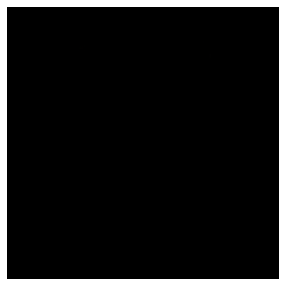

********************
 Epoch 289 and iteration 123 discriminator loss= 0.000000 generator loss= 25.848415


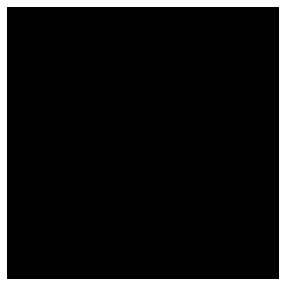

********************
 Epoch 290 and iteration 123 discriminator loss= 0.000001 generator loss= 17.156513


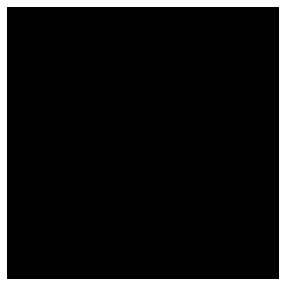

********************
 Epoch 291 and iteration 123 discriminator loss= 0.000000 generator loss= 18.911602


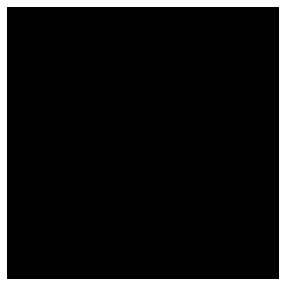

********************
 Epoch 292 and iteration 123 discriminator loss= 0.000001 generator loss= 16.306007


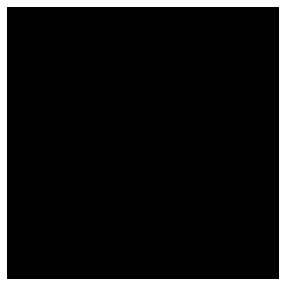

********************
 Epoch 293 and iteration 123 discriminator loss= 0.000002 generator loss= 15.706890


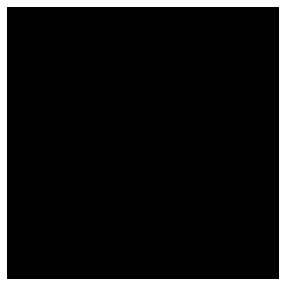

********************
 Epoch 294 and iteration 123 discriminator loss= 0.000000 generator loss= 20.467848


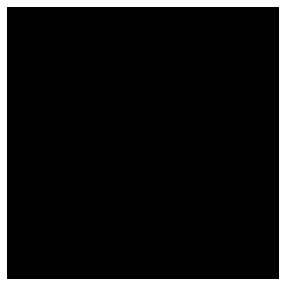

********************
 Epoch 295 and iteration 123 discriminator loss= 0.000000 generator loss= 17.566898


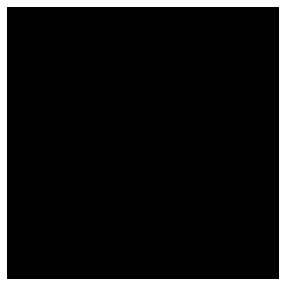

********************
 Epoch 296 and iteration 123 discriminator loss= 0.000002 generator loss= 15.164645


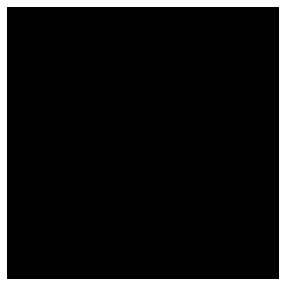

********************
 Epoch 297 and iteration 123 discriminator loss= 0.000001 generator loss= 15.412951


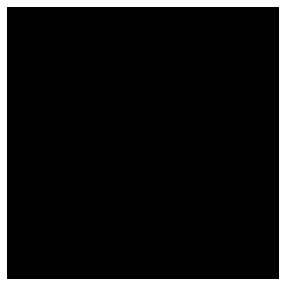

********************
 Epoch 298 and iteration 123 discriminator loss= 0.000000 generator loss= 19.349115


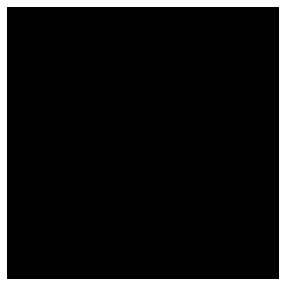

********************
 Epoch 299 and iteration 123 discriminator loss= 0.000000 generator loss= 20.509243


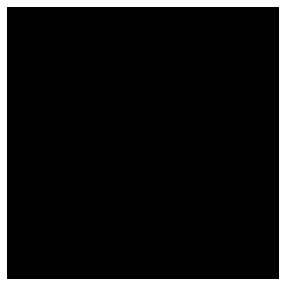

********************
 Epoch 300 and iteration 123 discriminator loss= 0.000001 generator loss= 15.681708


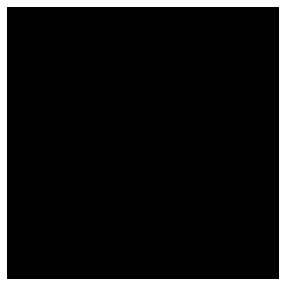

********************
 Epoch 301 and iteration 123 discriminator loss= 0.000000 generator loss= 17.055668


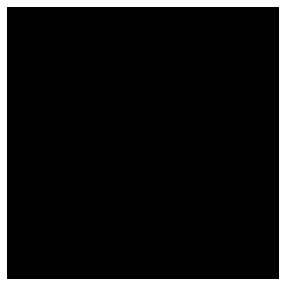

********************
 Epoch 302 and iteration 123 discriminator loss= 0.000001 generator loss= 16.516905


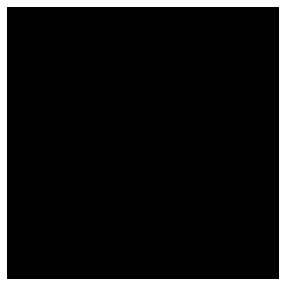

********************
 Epoch 303 and iteration 123 discriminator loss= 0.000001 generator loss= 16.330824


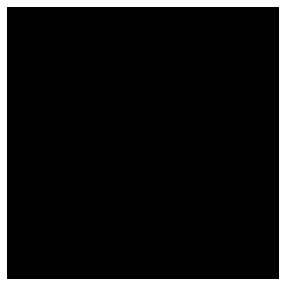

********************
 Epoch 304 and iteration 123 discriminator loss= 0.000000 generator loss= 16.472021


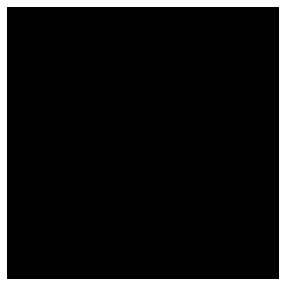

********************
 Epoch 305 and iteration 123 discriminator loss= 0.000001 generator loss= 15.916203


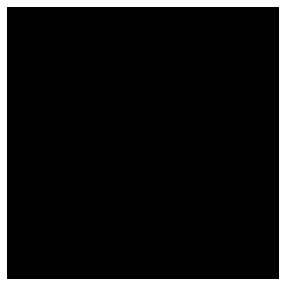

********************
 Epoch 306 and iteration 123 discriminator loss= 0.000001 generator loss= 15.984712


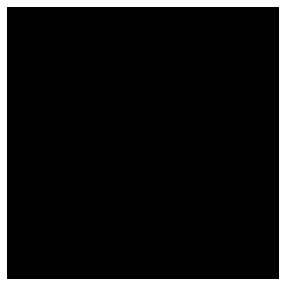

********************
 Epoch 307 and iteration 123 discriminator loss= 0.000000 generator loss= 16.518276


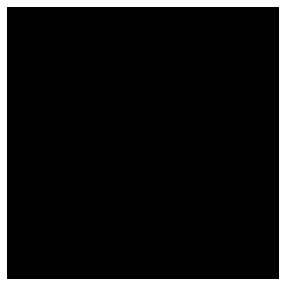

********************
 Epoch 308 and iteration 123 discriminator loss= 0.000001 generator loss= 16.850214


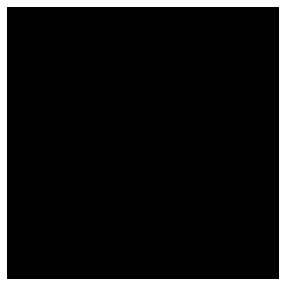

********************
 Epoch 309 and iteration 123 discriminator loss= 0.000007 generator loss= 16.786110


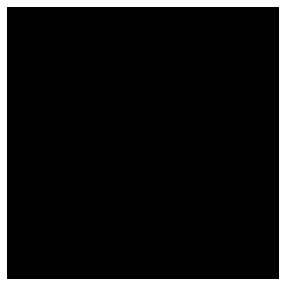

********************
 Epoch 310 and iteration 123 discriminator loss= 0.000000 generator loss= 22.938862


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


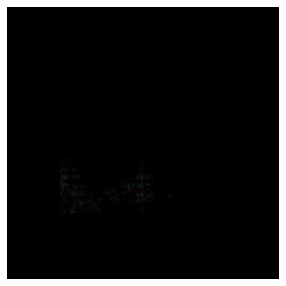

********************
 Epoch 311 and iteration 123 discriminator loss= 0.000000 generator loss= 17.577789


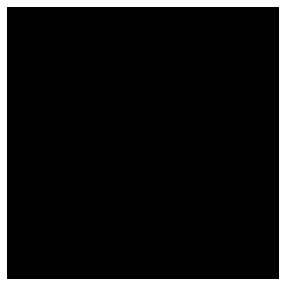

********************
 Epoch 312 and iteration 123 discriminator loss= 0.000000 generator loss= 17.579824


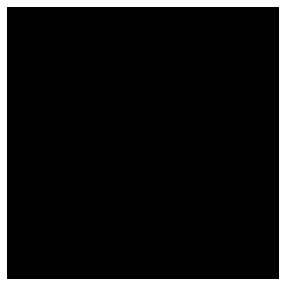

********************
 Epoch 313 and iteration 123 discriminator loss= 0.000000 generator loss= 17.973061


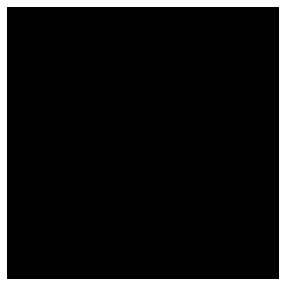

********************
 Epoch 314 and iteration 123 discriminator loss= 0.000000 generator loss= 17.578953


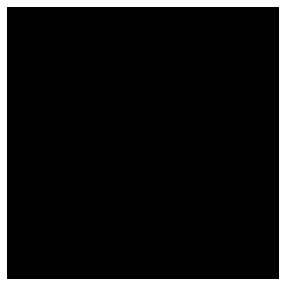

********************
 Epoch 315 and iteration 123 discriminator loss= 0.000000 generator loss= 22.169550


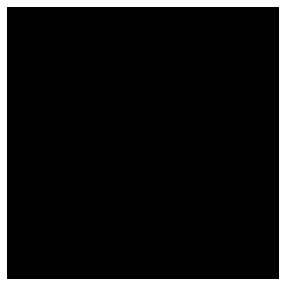

********************
 Epoch 316 and iteration 123 discriminator loss= 0.000000 generator loss= 22.056450


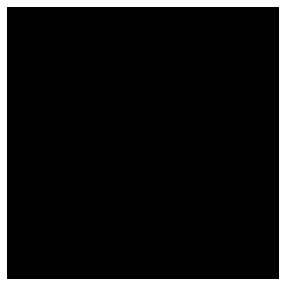

********************
 Epoch 317 and iteration 123 discriminator loss= 0.000005 generator loss= 18.626158


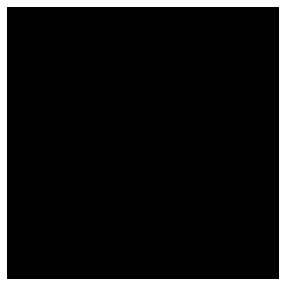

********************
 Epoch 318 and iteration 123 discriminator loss= 0.000000 generator loss= 18.855528


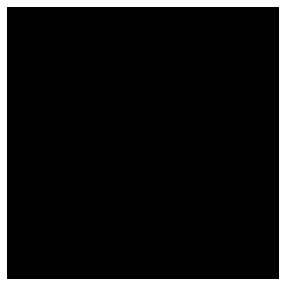

********************
 Epoch 319 and iteration 123 discriminator loss= 0.000000 generator loss= 19.063046


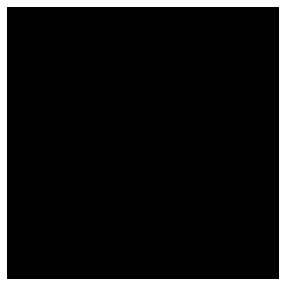

********************
 Epoch 320 and iteration 123 discriminator loss= 0.000000 generator loss= 19.072479


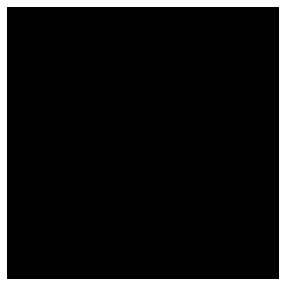

********************
 Epoch 321 and iteration 123 discriminator loss= 0.000000 generator loss= 19.915247


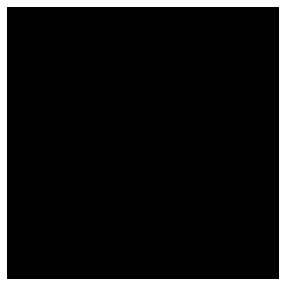

********************
 Epoch 322 and iteration 123 discriminator loss= 0.000000 generator loss= 23.403202


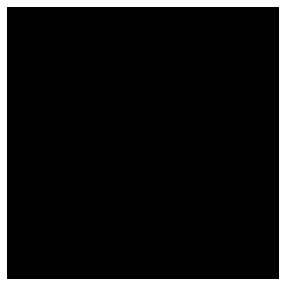

********************
 Epoch 323 and iteration 123 discriminator loss= 0.000000 generator loss= 65.644608


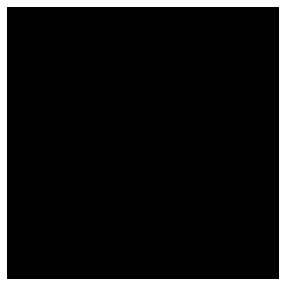

********************
 Epoch 324 and iteration 123 discriminator loss= 0.000000 generator loss= 20.264050


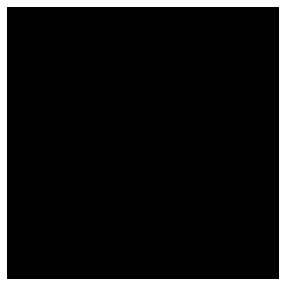

********************
 Epoch 325 and iteration 123 discriminator loss= 0.000000 generator loss= 20.837936


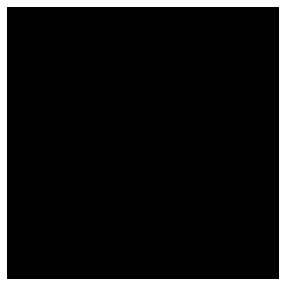

********************
 Epoch 326 and iteration 123 discriminator loss= 0.000000 generator loss= 21.102081


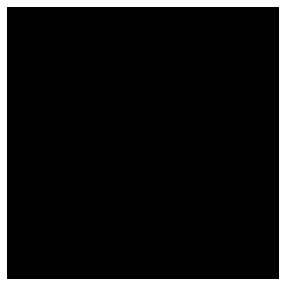

********************
 Epoch 327 and iteration 123 discriminator loss= 0.000000 generator loss= 30.178329


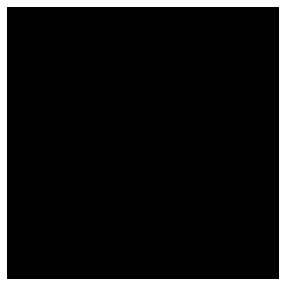

********************
 Epoch 328 and iteration 123 discriminator loss= 0.000000 generator loss= 21.103895


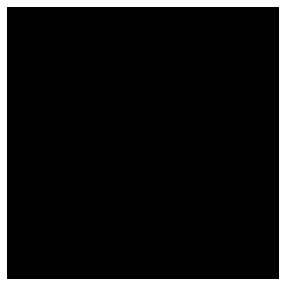

********************
 Epoch 329 and iteration 123 discriminator loss= 0.000000 generator loss= 20.764849


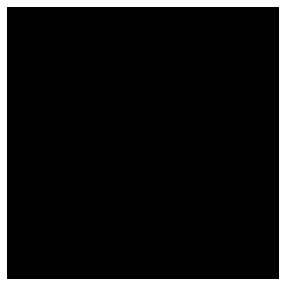

********************
 Epoch 330 and iteration 123 discriminator loss= 0.000000 generator loss= 22.711992


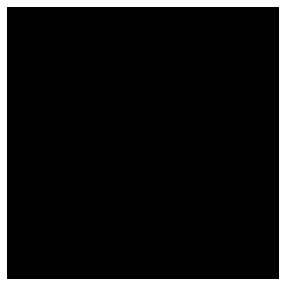

********************
 Epoch 331 and iteration 123 discriminator loss= 0.000000 generator loss= 20.528555


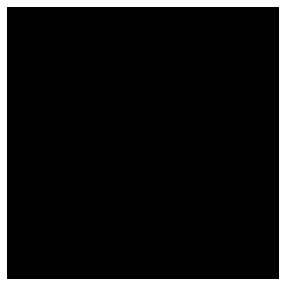

********************
 Epoch 332 and iteration 123 discriminator loss= 0.000000 generator loss= 21.050062


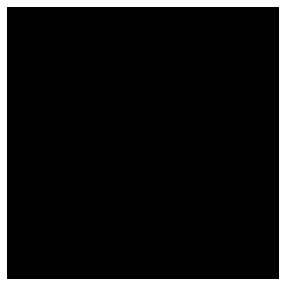

********************
 Epoch 333 and iteration 123 discriminator loss= 0.000000 generator loss= 20.916203


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


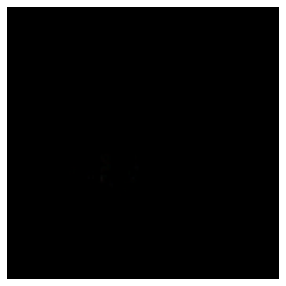

********************
 Epoch 334 and iteration 123 discriminator loss= 0.000000 generator loss= 78.075180


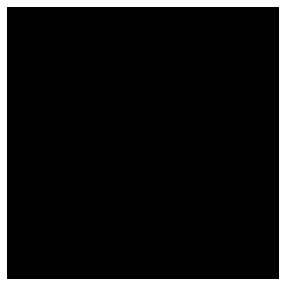

********************
 Epoch 335 and iteration 123 discriminator loss= 0.000000 generator loss= 19.523293


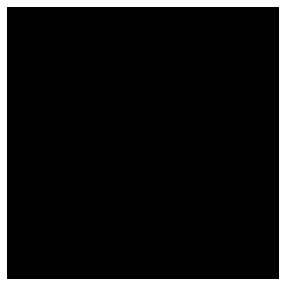

********************
 Epoch 336 and iteration 123 discriminator loss= 0.000000 generator loss= 20.278603


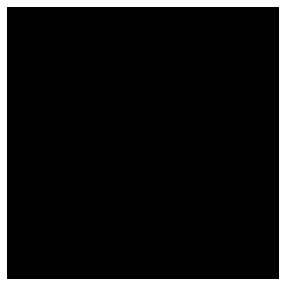

********************
 Epoch 337 and iteration 123 discriminator loss= 0.000000 generator loss= 19.651112


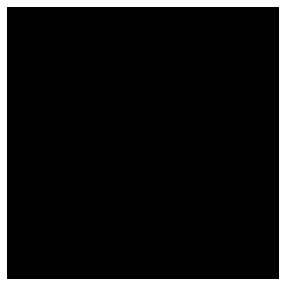

********************
 Epoch 338 and iteration 123 discriminator loss= 0.000000 generator loss= 20.830975


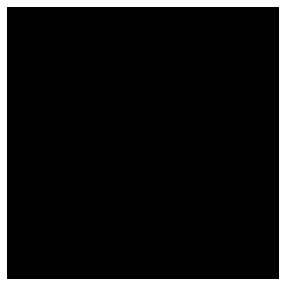

********************
 Epoch 339 and iteration 123 discriminator loss= 0.000000 generator loss= 24.885832


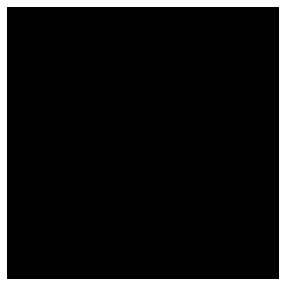

********************
 Epoch 340 and iteration 123 discriminator loss= 0.000000 generator loss= 20.471598


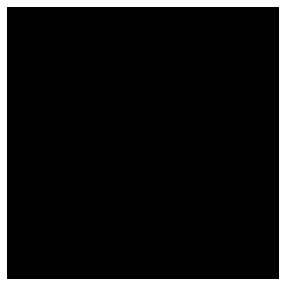

********************
 Epoch 341 and iteration 123 discriminator loss= 0.000000 generator loss= 20.291874


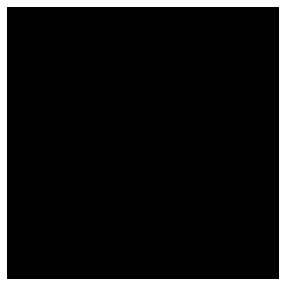

********************
 Epoch 342 and iteration 123 discriminator loss= 0.000000 generator loss= 20.703215


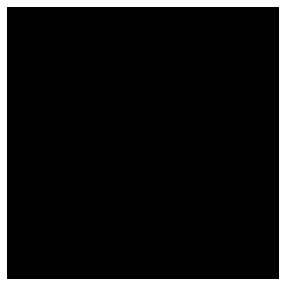

********************
 Epoch 343 and iteration 123 discriminator loss= 0.000000 generator loss= 29.324013


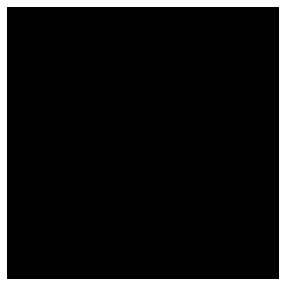

********************
 Epoch 344 and iteration 123 discriminator loss= 0.000000 generator loss= 21.387077


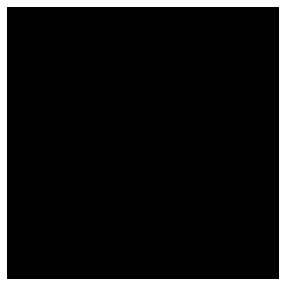

********************
 Epoch 345 and iteration 123 discriminator loss= 0.000000 generator loss= 23.885561


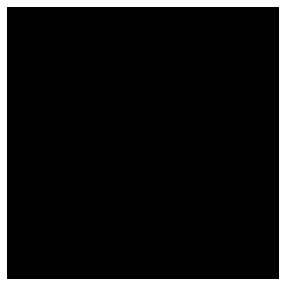

********************
 Epoch 346 and iteration 123 discriminator loss= 0.000000 generator loss= 21.626034


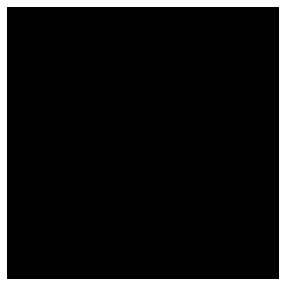

********************
 Epoch 347 and iteration 123 discriminator loss= 0.000000 generator loss= 23.107401


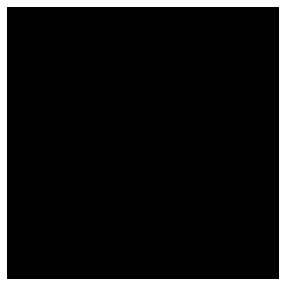

********************
 Epoch 348 and iteration 123 discriminator loss= 0.000000 generator loss= 21.875957


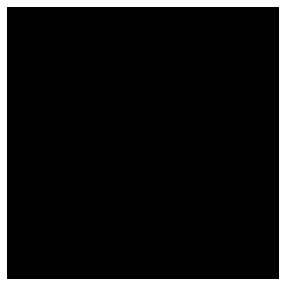

********************
 Epoch 349 and iteration 123 discriminator loss= 0.000000 generator loss= 23.018147


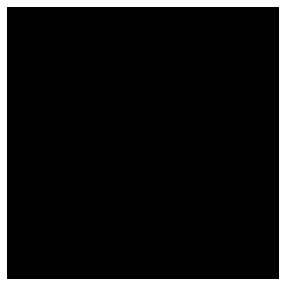

********************
 Epoch 350 and iteration 123 discriminator loss= 0.000000 generator loss= 30.598074


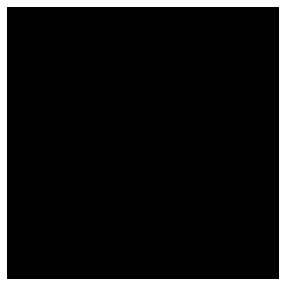

********************
 Epoch 351 and iteration 123 discriminator loss= 0.000000 generator loss= 21.817913


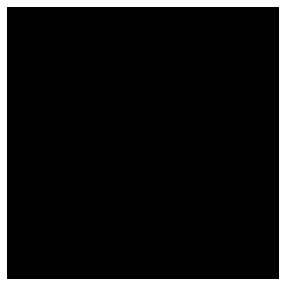

********************
 Epoch 352 and iteration 123 discriminator loss= 0.000000 generator loss= 21.910908


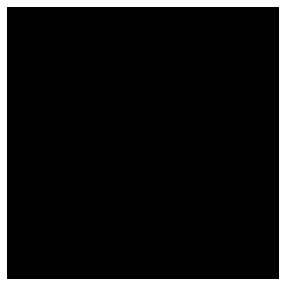

********************
 Epoch 353 and iteration 123 discriminator loss= 0.000000 generator loss= 21.734961


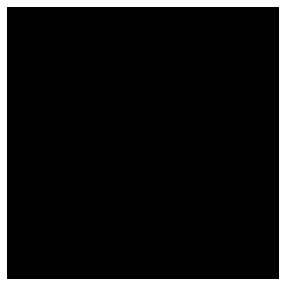

********************
 Epoch 354 and iteration 123 discriminator loss= 0.000000 generator loss= 22.549747


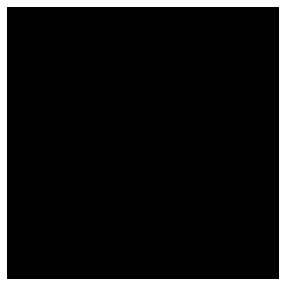

********************
 Epoch 355 and iteration 123 discriminator loss= 0.000000 generator loss= 22.463661


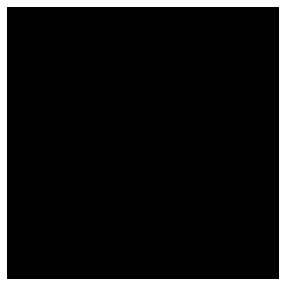

********************
 Epoch 356 and iteration 123 discriminator loss= 0.000000 generator loss= 22.741089


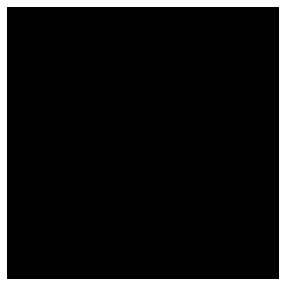

********************
 Epoch 357 and iteration 123 discriminator loss= 0.000000 generator loss= 21.378262


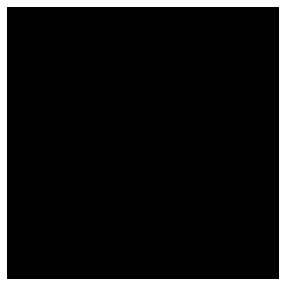

********************
 Epoch 358 and iteration 123 discriminator loss= 0.000000 generator loss= 21.045996


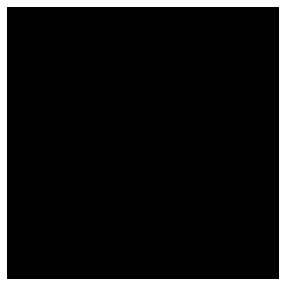

********************
 Epoch 359 and iteration 123 discriminator loss= 0.000000 generator loss= 21.570492


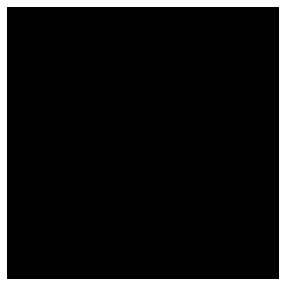

********************
 Epoch 360 and iteration 123 discriminator loss= 0.000000 generator loss= 21.909616


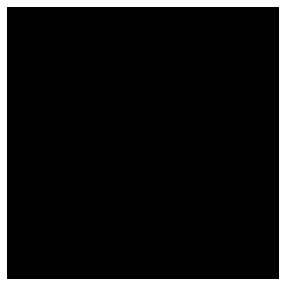

********************
 Epoch 361 and iteration 123 discriminator loss= 0.000113 generator loss= 12.708840


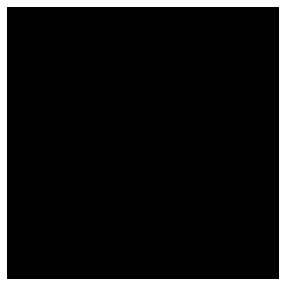

********************
 Epoch 362 and iteration 123 discriminator loss= 0.000244 generator loss= 15.593899


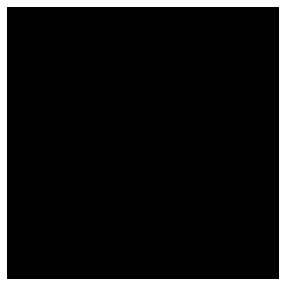

********************
 Epoch 363 and iteration 123 discriminator loss= 0.000040 generator loss= 17.253466


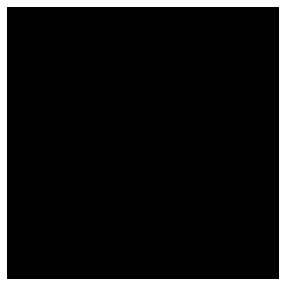

********************
 Epoch 364 and iteration 123 discriminator loss= 0.000095 generator loss= 12.858088


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


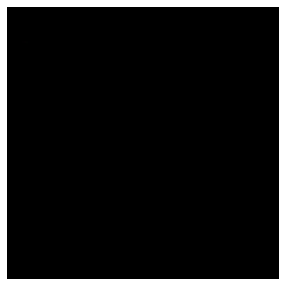

********************
 Epoch 365 and iteration 123 discriminator loss= 0.000046 generator loss= 15.139497


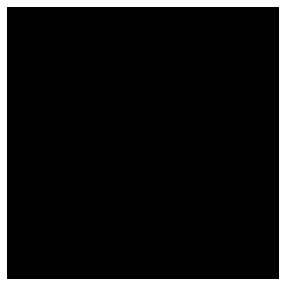

********************
 Epoch 366 and iteration 123 discriminator loss= 0.000068 generator loss= 13.175055


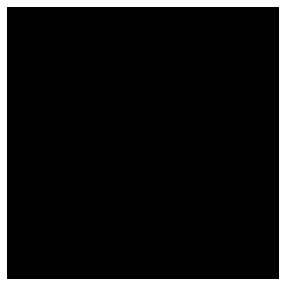

********************
 Epoch 367 and iteration 123 discriminator loss= 0.000054 generator loss= 13.404181


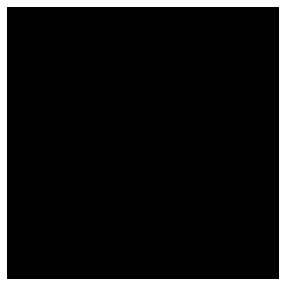

********************
 Epoch 368 and iteration 123 discriminator loss= 0.000009 generator loss= 18.638515


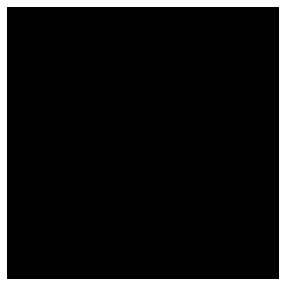

********************
 Epoch 369 and iteration 123 discriminator loss= 0.000035 generator loss= 13.815135


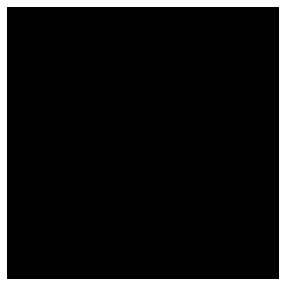

********************
 Epoch 370 and iteration 123 discriminator loss= 0.000002 generator loss= 19.863987


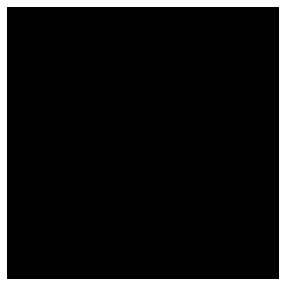

********************
 Epoch 371 and iteration 123 discriminator loss= 0.000018 generator loss= 14.461345


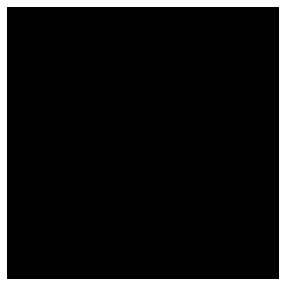

********************
 Epoch 372 and iteration 123 discriminator loss= 0.000032 generator loss= 13.906137


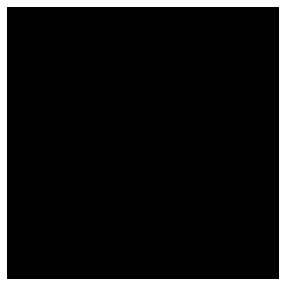

********************
 Epoch 373 and iteration 123 discriminator loss= 0.000015 generator loss= 14.596210


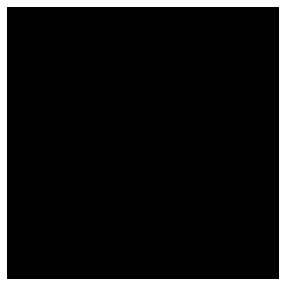

********************
 Epoch 374 and iteration 123 discriminator loss= 0.000021 generator loss= 14.313020


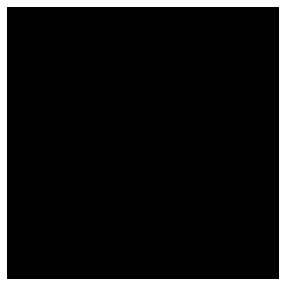

********************
 Epoch 375 and iteration 123 discriminator loss= 0.000023 generator loss= 14.232966


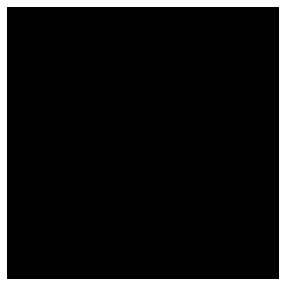

********************
 Epoch 376 and iteration 123 discriminator loss= 0.000000 generator loss= 22.104162


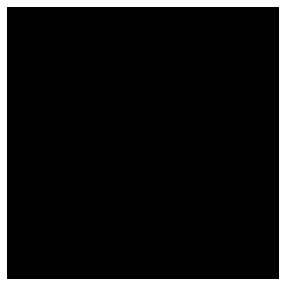

********************
 Epoch 377 and iteration 123 discriminator loss= 0.000005 generator loss= 15.649730


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


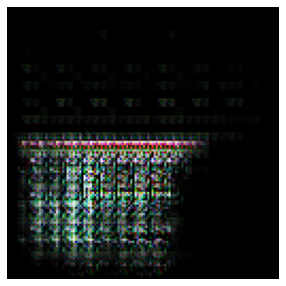

********************
 Epoch 378 and iteration 123 discriminator loss= 0.000008 generator loss= 15.281094


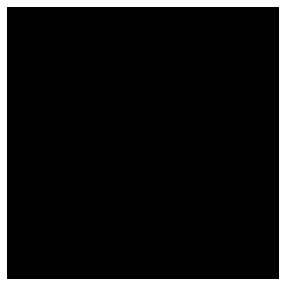

********************
 Epoch 379 and iteration 123 discriminator loss= 0.000001 generator loss= 17.638557


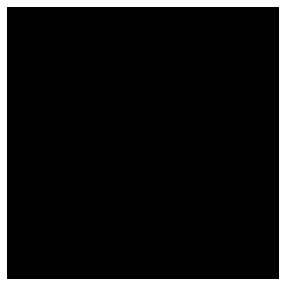

********************
 Epoch 380 and iteration 123 discriminator loss= 0.000001 generator loss= 18.772346


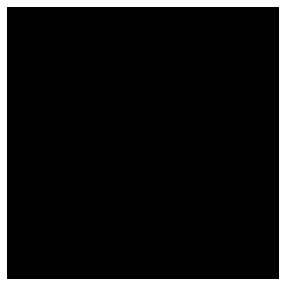

********************
 Epoch 381 and iteration 123 discriminator loss= 0.000003 generator loss= 16.272682


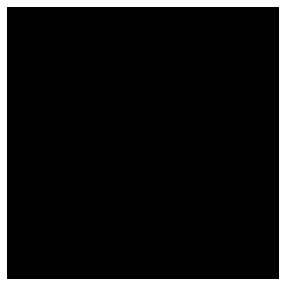

********************
 Epoch 382 and iteration 123 discriminator loss= 0.000002 generator loss= 16.549568


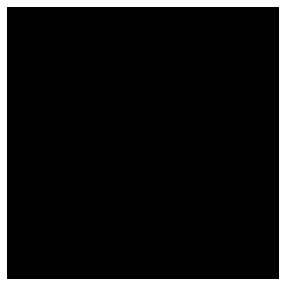

********************
 Epoch 383 and iteration 123 discriminator loss= 0.000003 generator loss= 16.114672


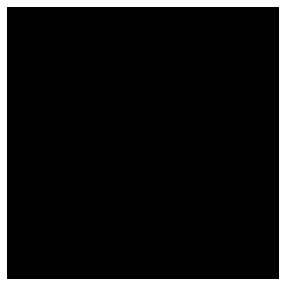

********************
 Epoch 384 and iteration 123 discriminator loss= 0.000001 generator loss= 19.185032


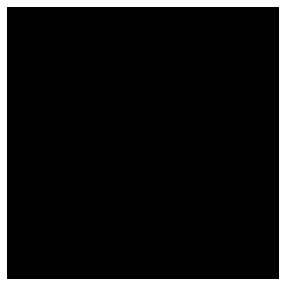

********************
 Epoch 385 and iteration 123 discriminator loss= 0.000003 generator loss= 16.246325


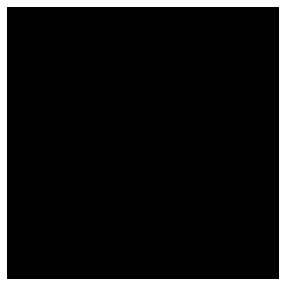

********************
 Epoch 386 and iteration 123 discriminator loss= 0.000003 generator loss= 16.333937


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


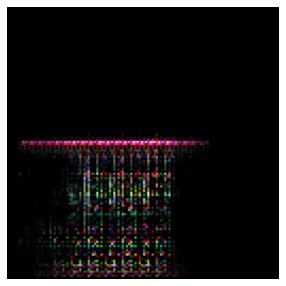

********************
 Epoch 387 and iteration 123 discriminator loss= 0.000002 generator loss= 16.363163


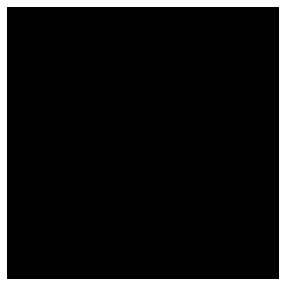

********************
 Epoch 388 and iteration 123 discriminator loss= 0.000002 generator loss= 16.588804


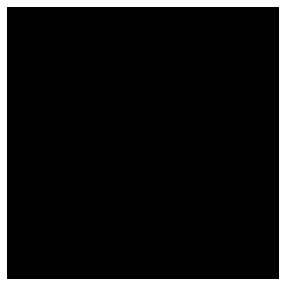

********************
 Epoch 389 and iteration 123 discriminator loss= 0.000002 generator loss= 16.593391


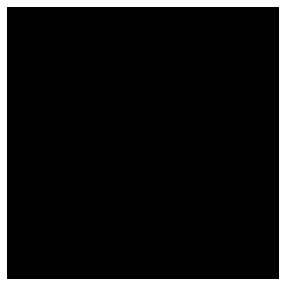

********************
 Epoch 390 and iteration 123 discriminator loss= 0.000002 generator loss= 16.524323


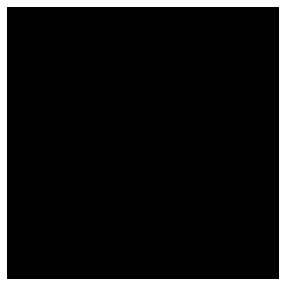

********************
 Epoch 391 and iteration 123 discriminator loss= 0.000002 generator loss= 16.383863


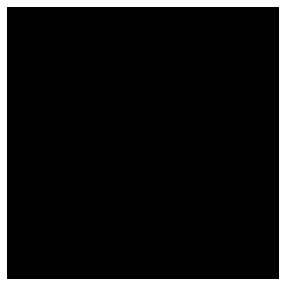

********************
 Epoch 392 and iteration 123 discriminator loss= 0.000001 generator loss= 17.637159


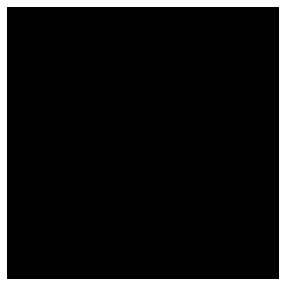

********************
 Epoch 393 and iteration 123 discriminator loss= 0.000013 generator loss= 14.776783


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


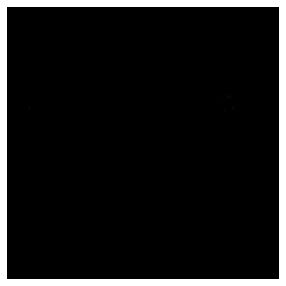

********************
 Epoch 394 and iteration 123 discriminator loss= 0.000061 generator loss= 22.826216


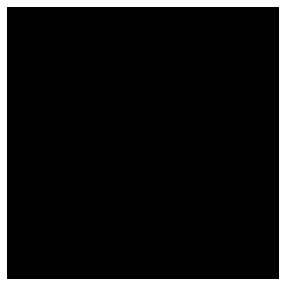

********************
 Epoch 395 and iteration 123 discriminator loss= 0.000000 generator loss= 22.291845


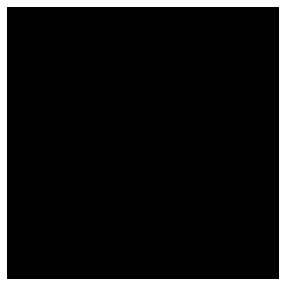

********************
 Epoch 396 and iteration 123 discriminator loss= 0.000000 generator loss= 21.121174


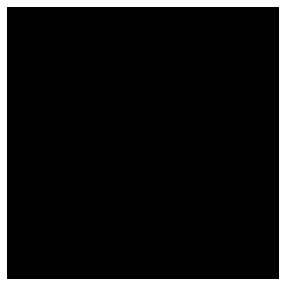

********************
 Epoch 397 and iteration 123 discriminator loss= 0.000000 generator loss= 20.928545


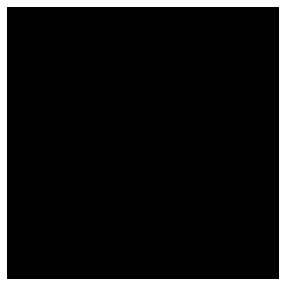

********************
 Epoch 398 and iteration 123 discriminator loss= 0.000000 generator loss= 20.551210


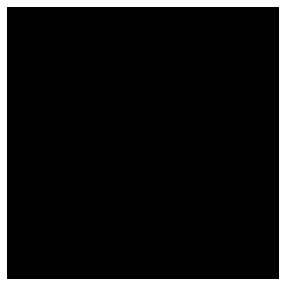

********************
 Epoch 399 and iteration 123 discriminator loss= 0.000000 generator loss= 22.737497


In [23]:
# TRAINING GANS
epochs = 400
L=[]
I=[]
# going over the entire dataset 10 times
for e in range(epochs):
    
    # pick each batch b of input images: shape of each batch is (32, 3, 32, 32)
    for i, b in enumerate(dataloader):

        ##########################
        ## Update Discriminator ##
        ##########################

        # Loss on real images
        
        # clear the gradient
        opt_D.zero_grad() # set the gradients to 0 at start of each loop because gradients are accumulated on subsequent backward passes
        # compute the D model output
        yhat = netD(b.to(device)).view(-1) # view(-1) reshapes a 4-d tensor of shape (2,1,1,1) to 1-d tensor with 2 values only
        # specify target labels or true labels
        target = torch.ones(len(b), dtype=torch.float, device=device)
        # calculate loss
        loss_real = loss(yhat, target)
        # calculate gradients -  or rather accumulation of gradients on loss tensor
        loss_real.backward()

        # Loss on fake images

        # generate batch of fake images using G
        # Step1: creating noise to be fed as input to G
        noise = torch.randn(len(b), 100, 1, 1, device = device)
        # Step 2: feed noise to G to create a fake img (this will be reused when updating G)
        fake_img = netG(noise) 
        
        # compute D model output on fake images
        yhat = netD.cuda()(fake_img.detach()).view(-1) # .cuda() is essential because our input i.e. fake_img is on gpu but model isnt (runtimeError thrown); detach is imp: Basically, only track steps on your generator optimizer when training the generator, NOT the discriminator. 
        # specify target labels
        target = torch.zeros(len(b), dtype=torch.float, device=device)
        # calculate loss
        loss_fake = loss(yhat, target)
        # calculate gradients
        loss_fake.backward()

        # total error on D
        loss_disc = loss_real + loss_fake
        # Update weights of D
        opt_D.step()

        ##########################
        #### Update Generator ####
        ##########################

        # clear gradient
        opt_G.zero_grad()
        # pass fake image through D
        yhat = netD.cuda()(fake_img).view(-1)
        # specify target variables - remember G wants D *to think* these are real images so label is 1
        target = torch.ones(len(b), dtype=torch.float, device=device)
        # calculate loss
        loss_gen = loss(yhat, target)
        # calculate gradients
        loss_gen.backward()
        # update weights on G
        opt_G.step()


        ####################################
        #### Plot some Generator images ####
        ####################################

        # during every epoch, print images at every 10th iteration.
        """"
        if i% 100 == 0:
            fake=netG(noise)
            vutils.save_image(fake.data,'%s/fake_examples_epoch_%04d.png' % ("./Generated_grid",e),normalize=True)
            # convert the fake images from (b_size, 3, 32, 32) to (b_size, 32, 32, 3) for plotting 
            img_plot = np.transpose(fake_img.detach().cpu(), (0,2,3,1))# .detach().cpu() is imp for copying fake_img tensor to host memory first
            plot_images(img_plot,e)
            print("********************")
            print(" Epoch %d and iteration %d discriminator loss= %f generator loss= %f" % (e, i,loss_disc,loss_gen))
            disc=loss_disc.detach().cpu().numpy()
            gen=loss_gen.detach().cpu().numpy()
            L.append(loss_disc.item())
            I.append(loss_gen.item())
        """
    fake=netG(noise)
    vutils.save_image(fake.data,'%s/fake_examples_epoch_%04d.png' % ("./Generated_grid",e),normalize=True)
    # convert the fake images from (b_size, 3, 32, 32) to (b_size, 32, 32, 3) for plotting 
    img_plot = np.transpose(fake_img.detach().cpu(), (0,2,3,1))# .detach().cpu() is imp for copying fake_img tensor to host memory first
    plot_images(img_plot,e)
    print("********************")
    print(" Epoch %d and iteration %d discriminator loss= %f generator loss= %f" % (e, i,loss_disc,loss_gen))
    disc=loss_disc.detach().cpu().numpy()
    gen=loss_gen.detach().cpu().numpy()
    L.append(loss_disc.item())
    I.append(loss_gen.item())

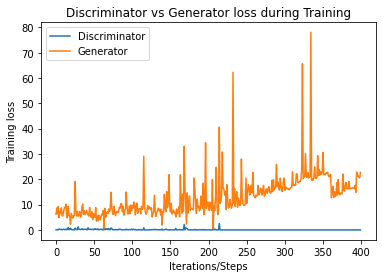

In [24]:
fig, ax = plt.subplots()
ax.plot(L, label='Discriminator')
ax.plot(I, label='Generator')
ax.set_xlabel('Iterations/Steps')
ax.set_ylabel('Training loss')
ax.set_title("Discriminator vs Generator loss during Training")
ax.legend()